In [13]:
import numpy as np
from matplotlib import pyplot as plt

In [14]:
import torch
torch.__version__

'2.6.0+cu124'

In [15]:
# Load MNIST data
from torchvision import datasets, transforms
mnist_train = datasets.MNIST(root="./datasets", train=True, transform=transforms.ToTensor(), download=True)
mnist_test = datasets.MNIST(root="./datasets", train=False, transform=transforms.ToTensor(), download=True)

100%|██████████| 9.91M/9.91M [00:11<00:00, 890kB/s] 
100%|██████████| 28.9k/28.9k [00:00<00:00, 126kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.17MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 6.88MB/s]


In [16]:
print(mnist_train)
x_train = mnist_train.data
y_train = mnist_train.targets
x_test = mnist_test.data
y_test = mnist_test.targets

Dataset MNIST
    Number of datapoints: 60000
    Root location: ./datasets
    Split: Train
    StandardTransform
Transform: ToTensor()


In [17]:
print(x_train.dtype)
print(x_train.shape)

torch.uint8
torch.Size([60000, 28, 28])


In [18]:
  x_train[0]

tensor([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,  18,
          18,  18, 126, 136, 175,  26, 166, 255, 247, 127,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   

In [19]:
y_train

tensor([5, 0, 4,  ..., 5, 6, 8])

In [20]:
# prepare data
x_train = x_train.type(torch.float32)
x_test = x_test.type(torch.float32)
x_train /= 255
x_test /= 255

tensor(5)


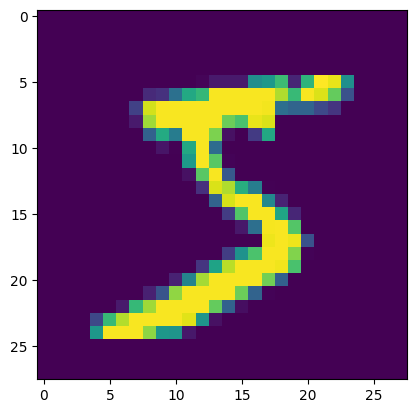

In [21]:
plt.imshow(x_train[0])
print(y_train[0])

In [22]:
# zmiana wymiarów - dodanie koloru
x_train = x_train.reshape(-1, 1, 28, 28)
x_test = x_test.reshape(-1, 1, 28, 28)
print(x_train.shape)

torch.Size([60000, 1, 28, 28])


# Simple neural networks

In [23]:
import torch.nn as nn

In [25]:
# multinomial logistic regression
# 1) płaska wartsta - wartstwa splaszczajaca nn.Flatten()
# 2) wartwa liniowa -  nn.Linear(28*28, 10), - wejscie splaszczone, wartwa liniowa nie ma funkcji aktywacji - powinien byc softmax i dostac prawdopodobienstwo
# - cross entropy loss zawiera soft max
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 10),  # softmax included in loss function
                    )

In [19]:
net

Sequential(
  (0): Flatten(start_dim=1, end_dim=-1)
  (1): Linear(in_features=784, out_features=10, bias=True)
)

In [26]:
list(net.children()) # iterator over layers

[Flatten(start_dim=1, end_dim=-1),
 Linear(in_features=784, out_features=10, bias=True)]

In [27]:
dict(net.named_children())

{'0': Flatten(start_dim=1, end_dim=-1),
 '1': Linear(in_features=784, out_features=10, bias=True)}

In [28]:
from torchsummary import summary
summary(net, (1, 28, 28), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                   [-1, 10]           7,850
Total params: 7,850
Trainable params: 7,850
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.03
Estimated Total Size (MB): 0.04
----------------------------------------------------------------


In [29]:
# trainable parametes
list(net.parameters()) # to są wszyzstkie parametry w modelu ktore wymagaja uczenia bias - obciazenie (wyrazow wolnych)

[Parameter containing:
 tensor([[ 0.0034, -0.0012,  0.0188,  ..., -0.0248, -0.0072, -0.0175],
         [ 0.0188,  0.0044,  0.0228,  ...,  0.0115,  0.0332, -0.0191],
         [ 0.0205, -0.0015,  0.0270,  ..., -0.0322,  0.0068,  0.0041],
         ...,
         [ 0.0235,  0.0073, -0.0137,  ...,  0.0172, -0.0270, -0.0326],
         [ 0.0081,  0.0167, -0.0145,  ..., -0.0109,  0.0208,  0.0244],
         [ 0.0056,  0.0353, -0.0148,  ...,  0.0065,  0.0096,  0.0077]],
        requires_grad=True),
 Parameter containing:
 tensor([ 0.0160,  0.0047,  0.0185, -0.0357,  0.0162,  0.0124, -0.0174,  0.0006,
          0.0111, -0.0178], requires_grad=True)]

In [30]:
list(net.named_parameters())

[('1.weight',
  Parameter containing:
  tensor([[ 0.0034, -0.0012,  0.0188,  ..., -0.0248, -0.0072, -0.0175],
          [ 0.0188,  0.0044,  0.0228,  ...,  0.0115,  0.0332, -0.0191],
          [ 0.0205, -0.0015,  0.0270,  ..., -0.0322,  0.0068,  0.0041],
          ...,
          [ 0.0235,  0.0073, -0.0137,  ...,  0.0172, -0.0270, -0.0326],
          [ 0.0081,  0.0167, -0.0145,  ..., -0.0109,  0.0208,  0.0244],
          [ 0.0056,  0.0353, -0.0148,  ...,  0.0065,  0.0096,  0.0077]],
         requires_grad=True)),
 ('1.bias',
  Parameter containing:
  tensor([ 0.0160,  0.0047,  0.0185, -0.0357,  0.0162,  0.0124, -0.0174,  0.0006,
           0.0111, -0.0178], requires_grad=True))]

# move to GPU

In [31]:
print(x_train.is_cuda)
next(net.parameters()).is_cuda

False


False

In [32]:
if torch.cuda.is_available():
    device = "cuda"
else:
    device = "cpu"

print(device)


# Check if MPS is available
# if torch.backends.mps.is_available():
#     device = torch.device("mps")
#     print("Using MPS device")
# else:
#     device = torch.device("cpu")
#     print("MPS not available, using CPU")


cuda


In [33]:
# need to move EVERYTHING to the right device
net.to(device)
x_train = x_train.to(device)
x_test = x_test.to(device)
y_train = y_train.to(device)
y_test = y_test.to(device)

x_train.device


device(type='cuda', index=0)

# training loop

In [38]:
# training loop
import torch.optim as optim
import tqdm.notebook

def fit(net, X_train=x_train, y_train=y_train, X_valid=x_test,
        y_valid=y_test, epochs=5, batch_size=128):
  if torch.cuda.is_available():
    device = "cuda"
    torch.cuda.empty_cache()
  else:
    device = "cpu"
  #
  # if torch.backends.mps.is_available():
  #   device = torch.device("mps")
  #   print("Using MPS device")
  # else:
  #   device = torch.device("cpu")
  #   print("MPS not available, using CPU")

  net = net.to(device)
  X_train = X_train.to(device)
  y_train = y_train.to(device)
  if X_valid is not None:
    X_valid = X_valid.to(device)
    y_valid = y_valid.to(device)
  summary(net, (1, 28, 28), device=device)

  # optimizer = optim.Adam(net.parameters())
  # optimizer = optim.SGD(net.parameters()) # duzo duzo slabsze - trzeba by bawic sie krokiem
  optimizer = optim.AdamW(net.parameters())

  epochs = epochs
  batch_size = batch_size

  # FUNKCJA STRATY
  loss = torch.nn.CrossEntropyLoss()  # includes softmax

  N = X_train.shape[0]
  for e in range(epochs):
      # shuffle
      idx = torch.randperm(X_train.shape[0])
      #reczne dzielenie na batche
      X_train = X_train[idx]
      y_train = y_train[idx]

      i = 0
      # split into mini batches
      # torch.utils.data.DataLoader does this automatically
      pbar = tqdm.notebook.tqdm(total=(N+batch_size-1)//batch_size)
      # przelaczanie w tryb uczenia
      net.train()
      while i < N:
          optimizer.zero_grad() #!!!
          # kolejna paczka danych
          j = min(N, i + batch_size)
          X_batch = X_train[i:j]
          y_batch = y_train[i:j]
          i = j

          # 4 NAJWAZNIEJSZE KROKI

          # PREDYKCJA PREDYKCJA PREDYKCJA
          # bierze paczke danych uczacych i zwraca predykcje - wej: 128 na 28*28 wyj: 128 na 10
          pred = net(X_batch)

          # STRATA STRATA STRATA STRATA
          # liczenie funkcji straty, domyślnie uśrednia - metoda najwiekszej wiarygonosci - softmax jest juz wbudowany
          l = loss(pred, y_batch)
          # liczymy gradient

          # GRADIENT GRADIENT GRADIENT GRADIENT
          l.backward()

          # KROK KROK KROK KROK
          # krok w kierunku przeciwnym do grdientu (SGD)
          optimizer.step()


          # rysowanie progres bar
          pbar.update(1)
      pbar.close()



      # przelaczam siec w tryb ewaluacji
      net.eval()
      if X_valid is not None:
        with torch.no_grad():
          pred = net(X_valid)
          predicted = pred.argmax(axis=1)
          print("epoch", e, "val accur", (1.0*(predicted==y_valid)).mean().item())
          net.train()

In [61]:
fit(net, x_train, y_train, x_test, y_test, 20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
           Sigmoid-3                  [-1, 128]               0
            Linear-4                   [-1, 10]           1,290
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.39
Estimated Total Size (MB): 0.40
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.977899968624115


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9777999520301819


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9777999520301819


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9777999520301819


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9777999520301819


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9775999784469604


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9777999520301819


In [54]:
print(y_train[:2])
print(net(x_train[0:2])) # logity z regresji logistycznej - na tych wektorach uruchamiamy softmax i dostajemy predykcję

tensor([5, 0], device='cuda:0')
tensor([[ -7.1059,  -1.5367,  -3.7481,   8.5939, -21.0383,  12.6653, -12.8914,
          -4.7001,  -6.5998,   0.4419],
        [ 10.8254,  -7.3195,   2.5347,  -4.0209,  -9.4696,  -1.9184,  -3.3183,
          -2.4567,  -4.2740,  -0.8523]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


In [55]:
nn.functional.softmax(net(x_train[0:2])) # predykcja

<ipython-input-55-2fe6d583334d>:1: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  nn.functional.softmax(net(x_train[0:2])) # predykcja


tensor([[2.5476e-09, 6.6807e-07, 7.3183e-08, 1.6768e-02, 2.2666e-15, 9.8323e-01,
         7.8262e-12, 2.8248e-08, 4.2260e-09, 4.8316e-06],
        [9.9973e-01, 1.3171e-08, 2.5077e-04, 3.5660e-07, 1.5342e-09, 2.9195e-06,
         7.2003e-07, 1.7042e-06, 2.7687e-07, 8.4785e-06]], device='cuda:0',
       grad_fn=<SoftmaxBackward0>)

# larger networks

In [65]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128), # warstwa ukryta co ma 128 neuronow - identycznosciowa funkcji aktywacji
                    nn.Sigmoid(), # funkcja aktywacji
                    nn.Linear(128, 10),  # softmax included in loss function
                    )
fit(net, epochs=20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
           Sigmoid-3                  [-1, 128]               0
            Linear-4                   [-1, 10]           1,290
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.39
Estimated Total Size (MB): 0.40
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9157999753952026


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9327999949455261


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9429999589920044


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9503999948501587


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9567999839782715


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9587000012397766


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9634999632835388


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9645999670028687


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9678999781608582


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9697999954223633


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9704999923706055


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.97079998254776


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9723999500274658


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9722999930381775


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9735999703407288


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9745999574661255


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.97489994764328


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9740999937057495


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9753999710083008


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9763000011444092


In [33]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128),nn.GELU(),
                    nn.Linear(128, 128), nn.GELU(),
                    nn.Linear(128, 10),  # softmax included in loss function
                    )
fit(net, epochs=20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              GELU-3                  [-1, 128]               0
            Linear-4                  [-1, 128]          16,512
              GELU-5                  [-1, 128]               0
            Linear-6                   [-1, 10]           1,290
Total params: 118,282
Trainable params: 118,282
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.45
Estimated Total Size (MB): 0.46
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9424999952316284


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9603999853134155


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9645999670028687


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9708999991416931


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9736999869346619


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9769999980926514


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9758999943733215


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9763000011444092


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9763999581336975


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9781999588012695


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.976099967956543


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9763999581336975


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9759999513626099


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9771999716758728


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9782999753952026


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9790999889373779


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9788999557495117


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9774999618530273


In [34]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128),
                    nn.ReLU(),
                    nn.Linear(128, 10),  # softmax included in loss function
                    )
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              ReLU-3                  [-1, 128]               0
            Linear-4                   [-1, 10]           1,290
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.39
Estimated Total Size (MB): 0.40
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9319999814033508


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9547999501228333


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9648000001907349


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9669999480247498


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9721999764442444


In [35]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128),
                    nn.GELU(),
                    nn.Linear(128, 10),  # softmax included in loss function
                    )
fit(net, epochs=20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              GELU-3                  [-1, 128]               0
            Linear-4                   [-1, 10]           1,290
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.39
Estimated Total Size (MB): 0.40
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9325000047683716


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.948699951171875


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9615999460220337


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9645999670028687


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9691999554634094


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.972599983215332


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9739999771118164


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9752999544143677


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9768999814987183


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9763000011444092


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9771999716758728


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.9782999753952026


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9782999753952026


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9774999618530273


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.979699969291687


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9785999655723572


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9788999557495117


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9781999588012695


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9775999784469604


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9782999753952026


In [36]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128), nn.ReLU(),
                    nn.Linear(128, 64), nn.ReLU(),
                    nn.Linear(64, 10),  # softmax included in loss function
                    )
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              ReLU-3                  [-1, 128]               0
            Linear-4                   [-1, 64]           8,256
              ReLU-5                   [-1, 64]               0
            Linear-6                   [-1, 10]             650
Total params: 109,386
Trainable params: 109,386
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.42
Estimated Total Size (MB): 0.43
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9383999705314636


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9575999975204468


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9624999761581421


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.97079998254776


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9710999727249146


In [ ]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128), nn.ReLU(),
                    nn.Linear(128, 128), nn.ReLU(),
                    nn.Linear(128, 64), nn.ReLU(),
                    nn.Linear(64, 10),  # softmax included in loss function
                    )
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              ReLU-3                  [-1, 128]               0
            Linear-4                  [-1, 128]          16,512
              ReLU-5                  [-1, 128]               0
            Linear-6                   [-1, 64]           8,256
              ReLU-7                   [-1, 64]               0
            Linear-8                   [-1, 10]             650
Total params: 125,898
Trainable params: 125,898
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.48
Estimated Total Size (MB): 0.49
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9415000081062317


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9613000154495239


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9660999774932861


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9700999855995178


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9725000262260437


# Regularization

In [ ]:
# L1/L2 regul must be computed by hand

In [67]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128),
                    nn.ReLU(),
                    nn.Dropout(0.25),
                    nn.Linear(128, 10),  # softmax included in loss function
                    )
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              ReLU-3                  [-1, 128]               0
           Dropout-4                  [-1, 128]               0
            Linear-5                   [-1, 10]           1,290
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.39
Estimated Total Size (MB): 0.40
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9362999796867371


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9510999917984009


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9625999927520752


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9680999517440796


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9700999855995178


In [72]:
# dropout przed czy po aktywacji ? - przy relu nie ma zanczenia

net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128), nn.ReLU(),
                    nn.Dropout(0.25),
                    nn.Linear(128, 128), nn.ReLU(),
                    nn.Dropout(0.25),
                    nn.Linear(128, 128), nn.GELU(),
                    nn.Dropout(0.25),
                    nn.Linear(128, 64), nn.ReLU(),
                    nn.Dropout(0.25),
                    nn.Linear(64, 32), nn.ReLU(), # softmax included in loss function
                    nn.Dropout(0.25),
                    nn.Linear(32, 10)
                    )
fit(net, epochs=20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              ReLU-3                  [-1, 128]               0
           Dropout-4                  [-1, 128]               0
            Linear-5                  [-1, 128]          16,512
              ReLU-6                  [-1, 128]               0
           Dropout-7                  [-1, 128]               0
            Linear-8                  [-1, 128]          16,512
              GELU-9                  [-1, 128]               0
          Dropout-10                  [-1, 128]               0
           Linear-11                   [-1, 64]           8,256
             ReLU-12                   [-1, 64]               0
          Dropout-13                   [-1, 64]               0
           Linear-14                   

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9323999881744385


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9537999629974365


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9630999565124512


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9688999652862549


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9714999794960022


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9704999923706055


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9728999733924866


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9732999801635742


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9750999808311462


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9723999500274658


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9753999710083008


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.975600004196167


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9759999513626099


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9757999777793884


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9764999747276306


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9782999753952026


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9784999489784241


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9765999913215637


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9764999747276306


In [ ]:
# Batch normalization

In [73]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128),
                    nn.ReLU(),
                    nn.BatchNorm1d(128),
                    nn.Linear(128, 10),  # softmax included in loss function
                    )
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              ReLU-3                  [-1, 128]               0
       BatchNorm1d-4                  [-1, 128]             256
            Linear-5                   [-1, 10]           1,290
Total params: 102,026
Trainable params: 102,026
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.39
Estimated Total Size (MB): 0.40
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9672999978065491


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.97079998254776


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9733999967575073


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9754999876022339


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9772999882698059


In [81]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128), nn.ReLU(),
                    nn.BatchNorm1d(128),
                    nn.Dropout(0.25),
                    nn.Linear(128, 128), nn.ReLU(),
                    nn.BatchNorm1d(128),
                    nn.Dropout(0.25),
                    nn.Linear(128, 64), nn.ReLU(),
                    nn.BatchNorm1d(64),
                    nn.Dropout(0.25),
                    nn.Linear(64, 32), nn.ReLU(),
                    nn.BatchNorm1d(32),nn.ReLU(),
                    nn.Dropout(0.25),
                    nn.Linear(32, 16),  # softmax included in loss function
                    nn.BatchNorm1d(16),nn.ReLU(),
                    nn.Dropout(0.25),
                    nn.Linear(16, 10),
                    )
fit(net, epochs=20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              ReLU-3                  [-1, 128]               0
       BatchNorm1d-4                  [-1, 128]             256
           Dropout-5                  [-1, 128]               0
            Linear-6                  [-1, 128]          16,512
              ReLU-7                  [-1, 128]               0
       BatchNorm1d-8                  [-1, 128]             256
           Dropout-9                  [-1, 128]               0
           Linear-10                   [-1, 64]           8,256
             ReLU-11                   [-1, 64]               0
      BatchNorm1d-12                   [-1, 64]             128
          Dropout-13                   [-1, 64]               0
           Linear-14                   

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9444999694824219


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9590999484062195


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.963699996471405


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9706999659538269


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9699999690055847


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9721999764442444


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9726999998092651


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9751999974250793


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9709999561309814


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9752999544143677


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9771999716758728


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9774999618530273


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9786999821662903


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9799999594688416


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9788999557495117


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9793999791145325


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9799000024795532


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9811999797821045


In [82]:
net = nn.Sequential(nn.Flatten(),
                    nn.Linear(28*28, 128), nn.ReLU(),
                    nn.BatchNorm1d(128),
                    nn.Linear(128, 128), nn.ReLU(),
                    nn.BatchNorm1d(128),
                    nn.Linear(128, 64), nn.ReLU(),
                    nn.BatchNorm1d(64),
                    nn.Linear(64, 10),
                    )
fit(net, epochs=50)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
              ReLU-3                  [-1, 128]               0
       BatchNorm1d-4                  [-1, 128]             256
            Linear-5                  [-1, 128]          16,512
              ReLU-6                  [-1, 128]               0
       BatchNorm1d-7                  [-1, 128]             256
            Linear-8                   [-1, 64]           8,256
              ReLU-9                   [-1, 64]               0
      BatchNorm1d-10                   [-1, 64]             128
           Linear-11                   [-1, 10]             650
Total params: 126,538
Trainable params: 126,538
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9669999480247498


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9729999899864197


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.975600004196167


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9764999747276306


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9795999526977539


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9795999526977539


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9789999723434448


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9799999594688416


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9793999791145325


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9804999828338623


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.979699969291687


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9803999662399292


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9799000024795532


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9795999526977539


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9811999797821045


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9818999767303467


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9787999987602234


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9815999865531921


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.983299970626831


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 20 val accur 0.9820999503135681


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 21 val accur 0.9804999828338623


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 22 val accur 0.9802999496459961


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 23 val accur 0.9822999835014343


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 24 val accur 0.9810999631881714


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 25 val accur 0.9825999736785889


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 26 val accur 0.9820999503135681


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 27 val accur 0.982699990272522


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 28 val accur 0.9801999926567078


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 29 val accur 0.9822999835014343


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 30 val accur 0.9827999472618103


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 31 val accur 0.9830999970436096


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 32 val accur 0.9830999970436096


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 33 val accur 0.9838999509811401


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 34 val accur 0.9818999767303467


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 35 val accur 0.98089998960495


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 36 val accur 0.9821999669075012


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 37 val accur 0.9809999465942383


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 38 val accur 0.9813999533653259


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 39 val accur 0.9820999503135681


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 40 val accur 0.9835000038146973


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 41 val accur 0.9813999533653259


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 42 val accur 0.9819999933242798


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 43 val accur 0.983299970626831


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 44 val accur 0.9812999963760376


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 45 val accur 0.9815999865531921


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 46 val accur 0.982699990272522


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 47 val accur 0.9842000007629395


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 48 val accur 0.9824999570846558


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 49 val accur 0.9830999970436096


# Convolutional layers

In [94]:
net = nn.Sequential(
    # liczba kanalow wejsciowych 1, liczba kanł wyj. 16 , rozmiar pola 3x3 (mozna podac touple)
    nn.Conv2d(1, 16, kernel_size=3),
    nn.ReLU(),
    nn.Flatten(),
    nn.Linear(26*26*16, 10),  # softmax included in loss function
  )

# kazdy neuron ma 10 wejsc (3x3 i 1 obcizajacy) i 16 filtrow czyli 160 parametrow

fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 26, 26]             160
              ReLU-2           [-1, 16, 26, 26]               0
           Flatten-3                [-1, 10816]               0
            Linear-4                   [-1, 10]         108,170
Total params: 108,330
Trainable params: 108,330
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.25
Params size (MB): 0.41
Estimated Total Size (MB): 0.66
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9566999673843384


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9696999788284302


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.976699948310852


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9789999723434448


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9795999526977539


In [95]:
net = nn.Sequential(
    # na wejsciu 1 obrazek z 1 kanalem kolorowym 0 16 filtro
    nn.Conv2d(1, 16, kernel_size=3),
    nn.ReLU(),
    # 16 filtrow na wejscie , wyjscie 32 filtry
    nn.Conv2d(16, 32, kernel_size=3),
    # klasyfikator wielowarstwowy z jedna warstwa ukryta
    nn.ReLU(),
    nn.Flatten(),
    nn.Dropout(0.25),
    # kazda warstwa splotowa ucina nam po 2 (bylo 28x28, potem 26x26 i ostatecznie 24x24) - 32 filtry
    nn.Linear(24*24*32, 128),
    nn.ReLU(),
    nn.Dropout(0.25),
    nn.Linear(128, 10),
  )
fit(net, epochs=10)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 26, 26]             160
              ReLU-2           [-1, 16, 26, 26]               0
            Conv2d-3           [-1, 32, 24, 24]           4,640
              ReLU-4           [-1, 32, 24, 24]               0
           Flatten-5                [-1, 18432]               0
           Dropout-6                [-1, 18432]               0
            Linear-7                  [-1, 128]       2,359,424
              ReLU-8                  [-1, 128]               0
           Dropout-9                  [-1, 128]               0
           Linear-10                   [-1, 10]           1,290
Total params: 2,365,514
Trainable params: 2,365,514
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.73
Params size (MB): 9.02
Estimat

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9764999747276306


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9836999773979187


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9864999651908875


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9875999689102173


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9881999492645264


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9902999997138977


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9896000027656555


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9886999726295471


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9893999695777893


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9896999597549438


In [48]:
net = nn.Sequential(
    # na wejsciu 1 obrazek z 1 kanalem kolorowym 0 16 filtro
    nn.Conv2d(1, 16, kernel_size=3),
    nn.ReLU(),
    # 16 filtrow na wejscie , wyjscie 32 filtry
    nn.Conv2d(16, 32, kernel_size=3),
    # klasyfikator wielowarstwowy z jedna warstwa ukryta
    nn.ReLU(),
    # 16 filtrow na wejscie , wyjscie 32 filtry
    nn.Conv2d(32, 64, kernel_size=3),
    # klasyfikator wielowarstwowy z jedna warstwa ukryta
    nn.ReLU(),
    nn.Flatten(),
    nn.Dropout(0.25),
    # kazda warstwa splotowa ucina nam po 2 (bylo 28x28, potem 26x26 i ostatecznie 24x24) - 32 filtry
    nn.Linear(22*22*64, 128),
    nn.ReLU(),
    nn.Dropout(0.25),
    nn.Linear(128, 10),
  )
fit(net, epochs=20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 26, 26]             160
              ReLU-2           [-1, 16, 26, 26]               0
            Conv2d-3           [-1, 32, 24, 24]           4,640
              ReLU-4           [-1, 32, 24, 24]               0
            Conv2d-5           [-1, 64, 22, 22]          18,496
              ReLU-6           [-1, 64, 22, 22]               0
           Flatten-7                [-1, 30976]               0
           Dropout-8                [-1, 30976]               0
            Linear-9                  [-1, 128]       3,965,056
             ReLU-10                  [-1, 128]               0
          Dropout-11                  [-1, 128]               0
           Linear-12                   [-1, 10]           1,290
Total params: 3,989,642
Trainable params: 3,989,642
Non-trainable params: 0
---------------------------

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9837999939918518


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9875999689102173


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9907999634742737


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9869999885559082


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9886999726295471


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.990399956703186


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9908999800682068


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9887999892234802


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9898999929428101


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9910999536514282


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.989799976348877


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.9912999868392944


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9907999634742737


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9893999695777893


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.991599977016449


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9910999536514282


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9896999597549438


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9898999929428101


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9889999628067017


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9908999800682068


In [34]:
net = nn.Sequential(
    # na wejsciu 1 obrazek z 1 kanalem kolorowym 0 16 filtro
    nn.Conv2d(1, 64, kernel_size=3),
    nn.ReLU(),
    # 16 filtrow na wejscie , wyjscie 32 filtry
    nn.Conv2d(64, 64, kernel_size=3),
    # klasyfikator wielowarstwowy z jedna warstwa ukryta
    nn.ReLU(),
    # 16 filtrow na wejscie , wyjscie 32 filtry
    nn.Conv2d(64, 64, kernel_size=3),
    # klasyfikator wielowarstwowy z jedna warstwa ukryta
    nn.ReLU(),
    nn.Flatten(),
    nn.Dropout(0.25),
    # kazda warstwa splotowa ucina nam po 2 (bylo 28x28, potem 26x26 i ostatecznie 24x24) - 32 filtry
    nn.Linear(22*22*64, 128),
    nn.ReLU(),
    nn.Dropout(0.25),
    nn.Linear(128, 10),
  )
fit(net, epochs=20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 26, 26]             640
              ReLU-2           [-1, 64, 26, 26]               0
            Conv2d-3           [-1, 64, 24, 24]          36,928
              ReLU-4           [-1, 64, 24, 24]               0
            Conv2d-5           [-1, 64, 22, 22]          36,928
              ReLU-6           [-1, 64, 22, 22]               0
           Flatten-7                [-1, 30976]               0
           Dropout-8                [-1, 30976]               0
            Linear-9                  [-1, 128]       3,965,056
             ReLU-10                  [-1, 128]               0
          Dropout-11                  [-1, 128]               0
           Linear-12                   [-1, 10]           1,290
Total params: 4,040,842
Trainable params: 4,040,842
Non-trainable params: 0
---------------------------

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9840999841690063


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9860999584197998


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9882999658584595


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9898999929428101


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.988599956035614


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9896000027656555


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9896000027656555


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9901999831199646


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9904999732971191


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9905999898910522


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9910999536514282


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.9912999868392944


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9905999898910522


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9887999892234802


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.990399956703186


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9905999898910522


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.991599977016449


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9906999468803406


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9921000003814697


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9918999671936035


In [96]:
layers = list(net.children())
layers

[Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1)),
 ReLU(),
 Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1)),
 ReLU(),
 Flatten(start_dim=1, end_dim=-1),
 Dropout(p=0.25, inplace=False),
 Linear(in_features=18432, out_features=128, bias=True),
 ReLU(),
 Dropout(p=0.25, inplace=False),
 Linear(in_features=128, out_features=10, bias=True)]

In [97]:
print(layers[0].weight.shape)
print(layers[0].bias.shape)

torch.Size([16, 1, 3, 3])
torch.Size([16])


tensor([[ 0.2715,  0.3828,  0.1144],
        [-0.2384, -0.1313,  0.2567],
        [-0.3051,  0.0704, -0.1933]], device='cuda:0',
       grad_fn=<SliceBackward0>)


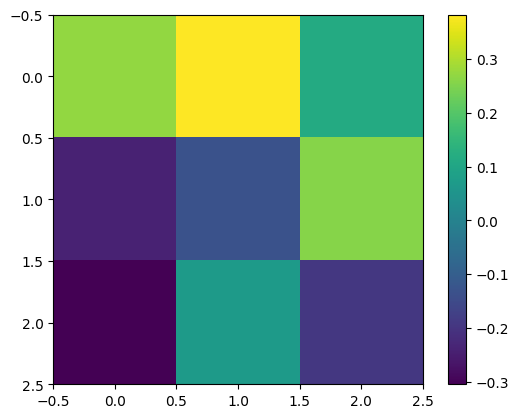

In [55]:
print(layers[0].weight[0,0,:,:]) # filter 0
#trzeba zrobic detach - wagi biora udzial w liczenie gradientow,
#tensor numpy musi byc odlaczony od gradientow i przerzucony na CPU
plt.imshow(layers[0].weight[0,0,:,:].detach().cpu())
plt.colorbar()

tensor([[ 0.2401, -0.1901,  0.1035],
        [ 0.0828, -0.3231, -0.0863],
        [ 0.1445,  0.1308,  0.0410]], device='cuda:0',
       grad_fn=<SliceBackward0>)


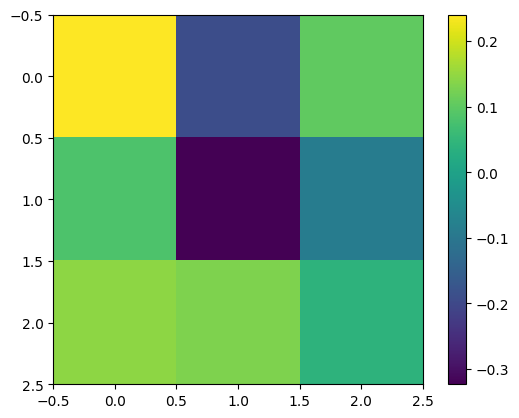

In [56]:
print(layers[0].weight[1,0,:,:]) # filter 1
plt.imshow(layers[0].weight[1,0,:,:].detach().cpu())
plt.colorbar()

tensor([[ 0.2001,  0.1297,  0.2867],
        [ 0.3527, -0.1146, -0.2588],
        [ 0.0624, -0.2972, -0.0489]], device='cuda:0',
       grad_fn=<SliceBackward0>)


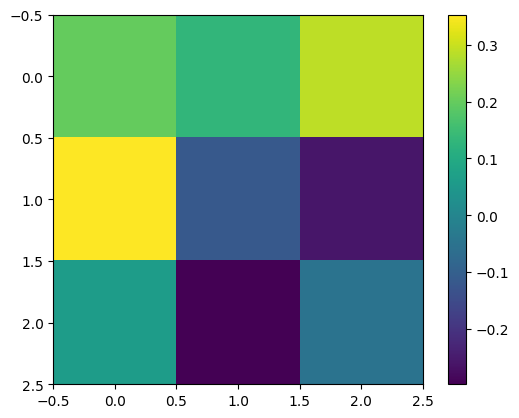

In [59]:
print(layers[0].weight[2,0,:,:]) # filter 2
plt.imshow(layers[0].weight[2,0,:,:].detach().cpu())
plt.colorbar()

In [98]:
print(layers[0](x_train[0:1]).shape)
layers[0](x_train[0:1])

torch.Size([1, 16, 26, 26])


tensor([[[[-0.1512, -0.1512, -0.1512,  ..., -0.1512, -0.1512, -0.1512],
          [-0.1512, -0.1512, -0.1512,  ..., -0.1512, -0.1512, -0.1512],
          [-0.1512, -0.1512, -0.1512,  ..., -0.1512, -0.1512, -0.1512],
          ...,
          [-0.1512, -0.1512, -0.3931,  ..., -0.1512, -0.1512, -0.1512],
          [-0.1512, -0.1512, -0.2409,  ..., -0.1512, -0.1512, -0.1512],
          [-0.1512, -0.1512, -0.1512,  ..., -0.1512, -0.1512, -0.1512]],

         [[-0.0114, -0.0114, -0.0114,  ..., -0.0114, -0.0114, -0.0114],
          [-0.0114, -0.0114, -0.0114,  ..., -0.0114, -0.0114, -0.0114],
          [-0.0114, -0.0114, -0.0114,  ..., -0.0114, -0.0114, -0.0114],
          ...,
          [-0.0114, -0.0114,  0.0384,  ..., -0.0114, -0.0114, -0.0114],
          [-0.0114, -0.0114, -0.0131,  ..., -0.0114, -0.0114, -0.0114],
          [-0.0114, -0.0114, -0.0114,  ..., -0.0114, -0.0114, -0.0114]],

         [[ 0.1319,  0.1319,  0.1319,  ...,  0.1319,  0.1319,  0.1319],
          [ 0.1319,  0.1319,  

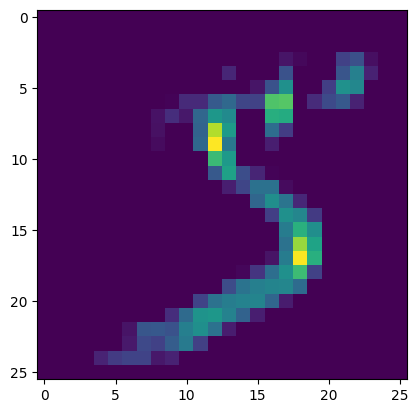

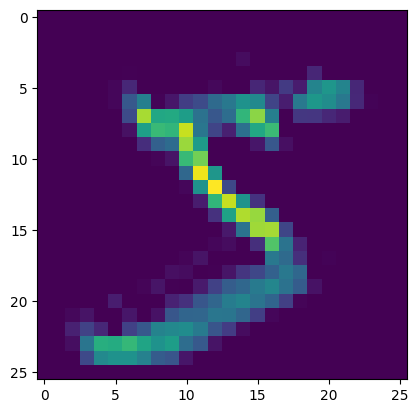

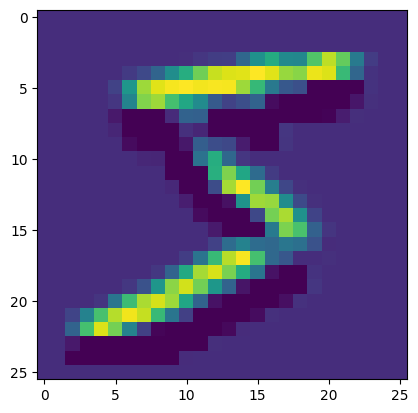

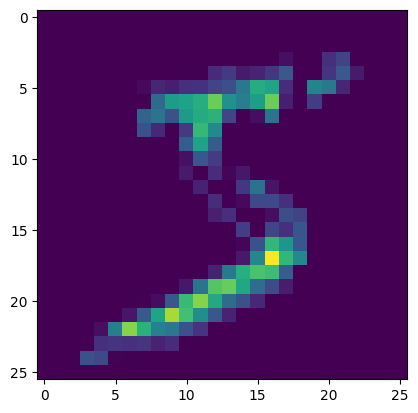

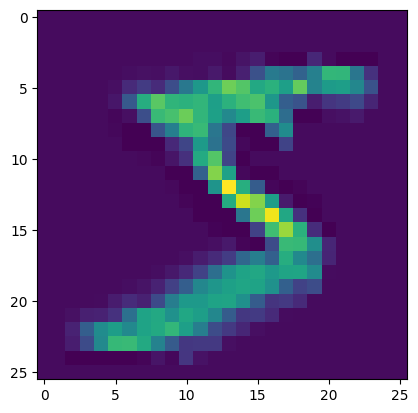

...

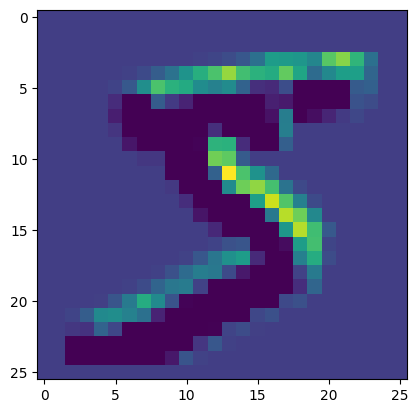

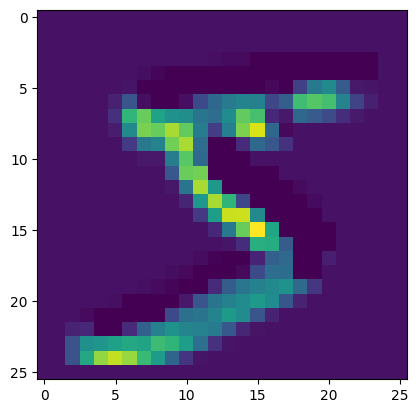

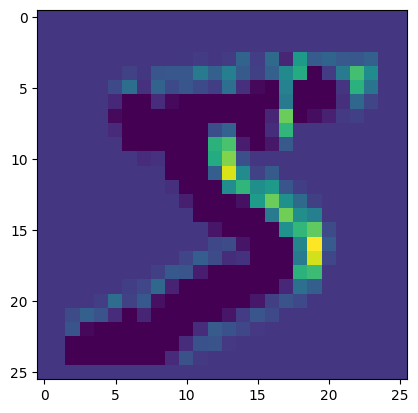

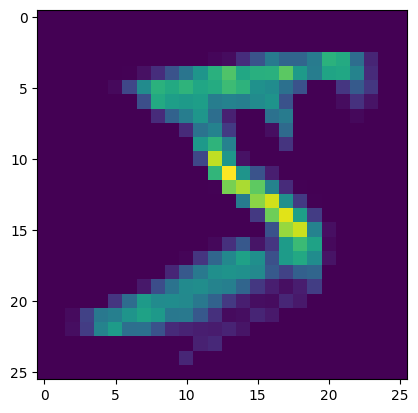

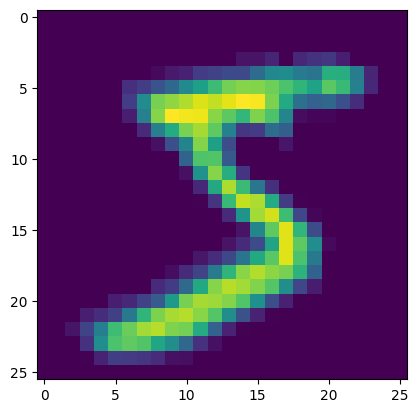

In [99]:
# outputs of first layer filters
tr_img = layers[0](x_train[0:1])
tr_img = layers[1](tr_img) # ReLU
tr_img = tr_img.detach().cpu().numpy()
for ch in range(16):
  plt.figure()
  plt.imshow(tr_img[0,ch,:,:])

<ipython-input-100-1af9d13a57b0>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


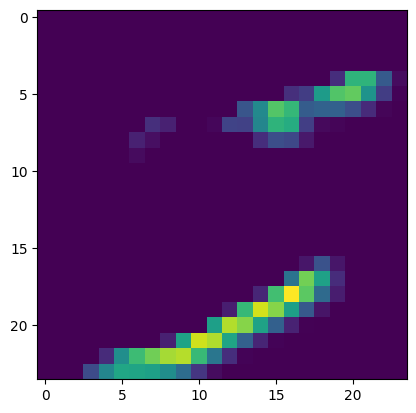

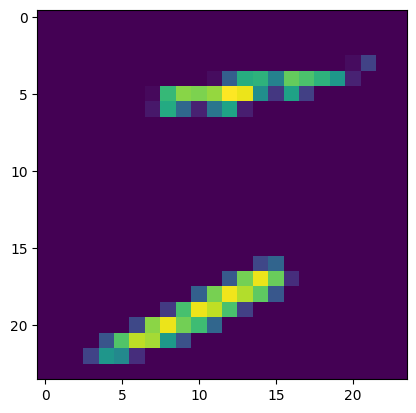

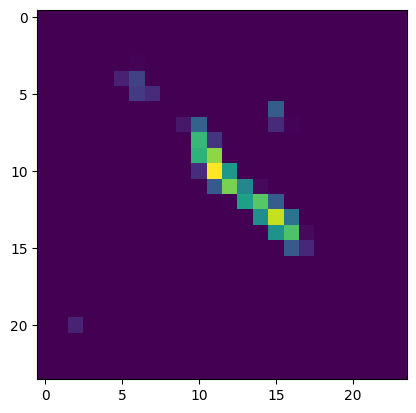

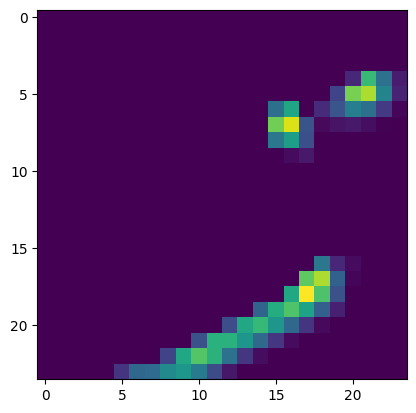

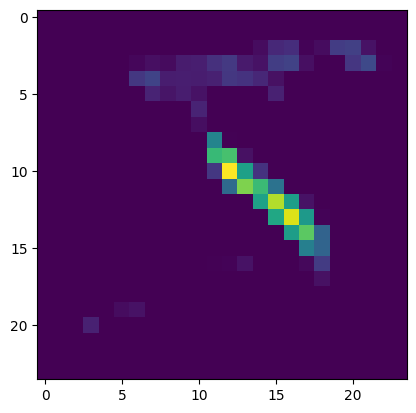

...

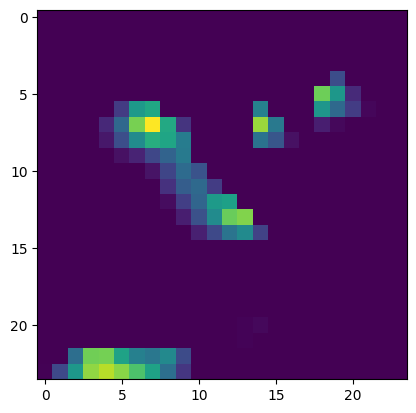

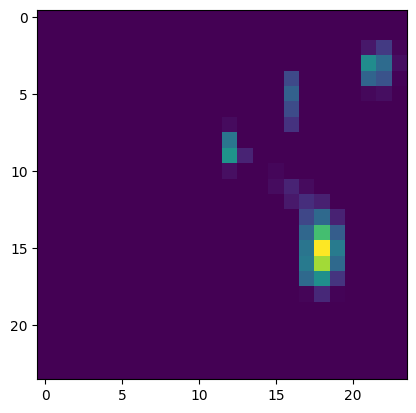

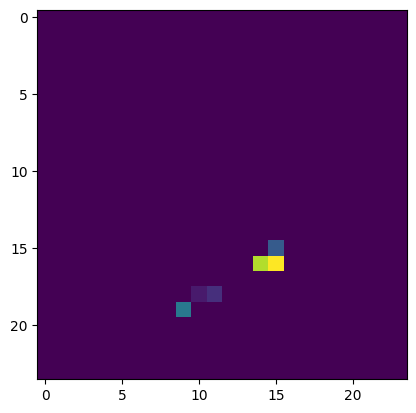

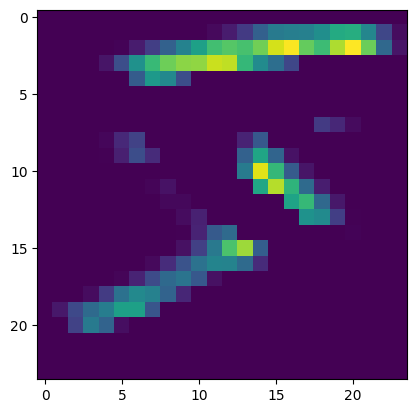

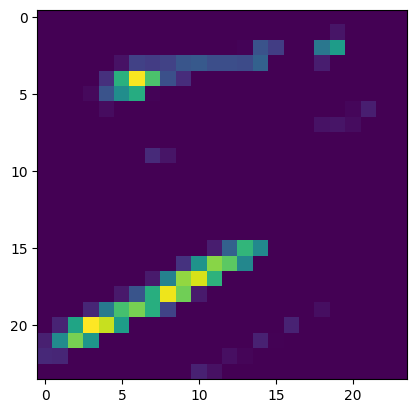

In [100]:
# outputs of second layer filters
tr_img = layers[0](x_train[0:1])
tr_img = layers[1](tr_img) # ReLU #reczne puszczenie przez warstwy
tr_img = layers[2](tr_img)
tr_img = layers[3](tr_img) # ReLU
tr_img = tr_img.detach().cpu().numpy()
for ch in range(32):
  plt.figure()
  plt.imshow(tr_img[0,ch,:,:])

# Pooling

In [102]:
net = nn.Sequential(
    nn.Conv2d(1, 16, kernel_size=3),
    nn.ReLU(),
    nn.Conv2d(16, 32, kernel_size=3),
    nn.ReLU(),
    #max pooling
    nn.MaxPool2d(2),
    nn.Flatten(),
    nn.Dropout(0.25),
    nn.Linear(12*12*32, 128),
    nn.ReLU(),
    nn.Dropout(0.25),
    nn.Linear(128, 10),
  )
fit(net, epochs=20)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 26, 26]             160
              ReLU-2           [-1, 16, 26, 26]               0
            Conv2d-3           [-1, 32, 24, 24]           4,640
              ReLU-4           [-1, 32, 24, 24]               0
         MaxPool2d-5           [-1, 32, 12, 12]               0
           Flatten-6                 [-1, 4608]               0
           Dropout-7                 [-1, 4608]               0
            Linear-8                  [-1, 128]         589,952
              ReLU-9                  [-1, 128]               0
          Dropout-10                  [-1, 128]               0
           Linear-11                   [-1, 10]           1,290
Total params: 596,042
Trainable params: 596,042
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9800999760627747


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9840999841690063


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9878999590873718


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9889999628067017


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9908999800682068


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9908999800682068


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9894999861717224


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9916999936103821


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9904999732971191


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9905999898910522


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.991599977016449


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.9916999936103821


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9917999505996704


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9912999868392944


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9900999665260315


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9918999671936035


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9921000003814697


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9916999936103821


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9900999665260315


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9906999468803406


In [103]:
net = nn.Sequential(
    nn.Conv2d(1, 16, kernel_size=3),
    nn.ReLU(),
    nn.Conv2d(16, 32, kernel_size=3),
    nn.ReLU(),
    nn.MaxPool2d(2),
    nn.Conv2d(32, 32, kernel_size=3),
    nn.ReLU(),
    nn.MaxPool2d(2),
    nn.Flatten(),
    nn.Dropout(0.25),
    nn.Linear(5*5*32, 128),
    nn.ReLU(),
    nn.Dropout(0.25),
    nn.Linear(128, 10),
  )
fit(net, epochs=20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 26, 26]             160
              ReLU-2           [-1, 16, 26, 26]               0
            Conv2d-3           [-1, 32, 24, 24]           4,640
              ReLU-4           [-1, 32, 24, 24]               0
         MaxPool2d-5           [-1, 32, 12, 12]               0
            Conv2d-6           [-1, 32, 10, 10]           9,248
              ReLU-7           [-1, 32, 10, 10]               0
         MaxPool2d-8             [-1, 32, 5, 5]               0
           Flatten-9                  [-1, 800]               0
          Dropout-10                  [-1, 800]               0
           Linear-11                  [-1, 128]         102,528
             ReLU-12                  [-1, 128]               0
          Dropout-13                  [-1, 128]               0
           Linear-14                   

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9802999496459961


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9860999584197998


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9901999831199646


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9902999997138977


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9909999966621399


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9916999936103821


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9908999800682068


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9921000003814697


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9929999709129333


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9919999837875366


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9924999475479126


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.9921000003814697


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9935999512672424


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9926999807357788


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9935999512672424


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9927999973297119


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9937999844551086


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9941999912261963


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9930999875068665


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9939000010490417


# Scheduling / checkpointing

In [ ]:
# TODO

# General API

In [29]:
class Net11(nn.Module):
    def __init__(self):
        super().__init__()
        # create layers
        self.fl = nn.Flatten()
        self.ll1 = nn.Linear(28*28, 128)
        self.ll2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.fl(x)
        x = self.ll1(x)
        # below: can use a ReLU layer or functional.relu function
        x = nn.functional.relu(x)
        x = self.ll2(x)
        return x

net = Net11()
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
            Linear-3                   [-1, 10]           1,290
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.39
Estimated Total Size (MB): 0.40
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9321999549865723


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9509999752044678


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9567999839782715


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.965399980545044


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9700999855995178


In [ ]:
# flexibility!!!

class Net11a(nn.Module):
    def __init__(self):
        super().__init__()
        # create layers
        self.fl = nn.Flatten()
        self.ll1 = nn.Linear(28*28, 128)
        self.ll2 = nn.Linear(128, 10)
        self.ll3 = nn.Linear(128, 128)  # just for test

    def forward(self, x):
        x = self.fl(x)
        x = self.ll1(x)
        x = nn.functional.relu(x)
        # arbitrary operations
        x = 3*x + torch.sqrt(x.sin())
        # repeated application of the same layer
        for i in range(3):
            x = self.ll3(x)
            x = nn.functional.relu(x)
        x = self.ll2(x)
        return x

net = Net11a()
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 128]         100,480
            Linear-3                  [-1, 128]          16,512
            Linear-4                  [-1, 128]          16,512
            Linear-5                  [-1, 128]          16,512
            Linear-6                   [-1, 10]           1,290
Total params: 151,306
Trainable params: 151,306
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.58
Estimated Total Size (MB): 0.59
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.09799999743700027


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.09799999743700027


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.09799999743700027


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.09799999743700027


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.09799999743700027


In [2]:
# make life easier
import torch.nn.functional as F

In [39]:
# side by side conv layers
class Net12(nn.Module):
    def __init__(self):
        super().__init__()
        # create layers
        self.c10 = nn.Conv2d(1, 64, kernel_size=3)
        self.c11 = nn.Conv2d(64, 64, kernel_size=3)
        self.c12 = nn.Conv2d(64, 64, kernel_size=3)

        self.c2 = nn.Conv2d(1, 32, kernel_size=3)

        self.c3 = nn.Conv2d(1, 32, kernel_size=3)

        self.fl1 = nn.Flatten()
        self.fl2 = nn.Flatten()
        self.fl3 = nn.Flatten()

        self.ll1 = nn.Linear(22*22*64 + 26*26*32 + 26*26*32, 128)
        self.ll2 = nn.Linear(128, 10)

    def forward(self, x):
        x1 = self.c10(x)
        x1 = F.relu(x1)
        x1 = self.c11(x1)
        x1 = F.relu(x1)
        x1 = self.c12(x1)
        x1 = F.relu(x1)
        x1 = self.fl1(x1)

        x2 = self.c2(x)
        x2 = F.relu(x2)
        x2 = self.fl2(x2)

        x3 = self.c3(x)
        x3 = F.relu(x3)
        x3 = self.fl3(x3)

        x = torch.cat([x1, x2, x3], 1) # along dimension 1!  dim 0 is # record in batch
        x = self.ll1(x)
        x = F.relu(x)
        x = F.dropout(x, p=0.25)
        x = self.ll2(x)
        return x

net = Net12()
fit(net, epochs=10)

# Keras for comparison
# input = keras.layers.Input(shape=(28,28,1))
#c1 = Conv2D(32, (3, 3), activation='relu')(input)
#f1 = Flatten()(c1)
#c2 = Conv2D(8, (5, 5), activation='relu')(input)
#f2 = Flatten()(c2)
#x = keras.layers.Concatenate()([f1, f2])
#output = Dense(units=10, activation='softmax')(x)
#model14 = keras.models.Model(inputs=input, outputs=output)
#compile_and_run(model14)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 26, 26]             640
            Conv2d-2           [-1, 64, 24, 24]          36,928
            Conv2d-3           [-1, 64, 22, 22]          36,928
           Flatten-4                [-1, 30976]               0
            Conv2d-5           [-1, 32, 26, 26]             320
           Flatten-6                [-1, 21632]               0
            Conv2d-7           [-1, 32, 26, 26]             320
           Flatten-8                [-1, 21632]               0
            Linear-9                  [-1, 128]       9,502,848
           Linear-10                   [-1, 10]           1,290
Total params: 9,579,274
Trainable params: 9,579,274
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 1.75
Params size (MB): 36.54
Estima

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9581999778747559


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.972599983215332


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9779999852180481


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9782999753952026


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9829999804496765


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9853000044822693


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9809999465942383


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9861999750137329


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9847999811172485


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9810999631881714


# Submodules

In [42]:
class VisionModel(nn.Module):
    def __init__(self):
        super().__init__()
        # create layers
        self.c1 = nn.Conv2d(1, 32, kernel_size=3)
        self.c2 = nn.Conv2d(32, 32, kernel_size=3)
        self.pool = nn.MaxPool2d(2)
        self.fl = nn.Flatten()
    def forward(self, x):
        x = self.c1(x)
        x = F.relu(x)
        x = self.c2(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.fl(x)
        return x

In [43]:
class ComparDigits(nn.Module):
   def __init__(self):
        super().__init__()
        self.vm = VisionModel()
        self.ll1 = nn.Linear(32*12*12+32*12*12, 1)
   def forward(self, digit1, digit2):
        x1 = self.vm(digit1)  # shared weights: same submodule applied to different inputs
        x2 = self.vm(digit2)
        x = torch.cat([x1, x2], 1)
        x = self.ll1(x)
        return x

In [44]:
# special training loop
def fit_pairs(net, X_train=x_train, y_train=y_train, X_valid=x_test,
        y_valid=y_test, epochs=5, batch_size=128):
  if torch.cuda.is_available():
    device = "cuda"
  else:
    device = "cpu"
  net = net.to(device)
  X_train = X_train.to(device)
  y_train = y_train.to(device)
  if X_valid is not None:
    X_valid = X_valid.to(device)
    y_valid = y_valid.to(device)
  # note: wrong number of params:
  summary(net, [(1, 28, 28), (1, 28, 28)], device=device)

  optimizer = optim.Adam(net.parameters())
  epochs = epochs
  batch_size = batch_size
  # single output: use a different loss:
  #binary cross entropy loss
  loss = torch.nn.BCEWithLogitsLoss()  # includes sigmoid activation
  N = X_train.shape[0]
  for e in range(epochs):
      idx = torch.randperm(X_train.shape[0])
      X_train2 = X_train[idx]
      y_train2 = y_train[idx]

      i = 0
      # split into mini batches
      # torch.utils.data.DataLoader does this automatically
      pbar = tqdm.notebook.tqdm(total=(N+batch_size-1)//batch_size)
      while i < N:
          optimizer.zero_grad()
          j = min(N, i + batch_size)
          X_batch1 = X_train[i:j]
          X_batch2 = X_train2[i:j]
          y_batch = 1*(y_train[i:j] == y_train2[i:j])
          i = j
          pred = net(X_batch1, X_batch2)
          # Reshape y_batch to have the same number of dimensions as pred
          # using unsqueeze to add a dimension of size 1
          l = loss(pred, y_batch.unsqueeze(1).float())
          l.backward()
          optimizer.step()
          pbar.update(1)
      pbar.close()
      if X_valid is not None:
        with torch.no_grad():
          idx_v = torch.randperm(X_valid.shape[0])
          X_valid2 = X_valid[idx_v]
          y_valid2 = y_valid[idx_v]
          pred = net(X_valid, X_valid2)
          predicted = (pred > 0)
          val_acc = (1.0*(predicted==(y_valid==y_valid2))).mean().item()
          print("epoch", e, "val accur", val_acc)

In [45]:
cd_net = ComparDigits()
fit_pairs(cd_net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 26, 26]             320
            Conv2d-2           [-1, 32, 24, 24]           9,248
         MaxPool2d-3           [-1, 32, 12, 12]               0
           Flatten-4                 [-1, 4608]               0
       VisionModel-5                 [-1, 4608]               0
            Conv2d-6           [-1, 32, 26, 26]             320
            Conv2d-7           [-1, 32, 24, 24]           9,248
         MaxPool2d-8           [-1, 32, 12, 12]               0
           Flatten-9                 [-1, 4608]               0
      VisionModel-10                 [-1, 4608]               0
           Linear-11                    [-1, 1]           9,217
Total params: 28,353
Trainable params: 28,353
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 2.34
Forward/ba

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.8931999802589417


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9002999663352966


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9031000137329102


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.8998000025749207


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.8991000056266785


In [46]:
list((p[0], np.prod(p[1].shape)) for p in cd_net.named_parameters())

[('vm.c1.weight', 288),
 ('vm.c1.bias', 32),
 ('vm.c2.weight', 9216),
 ('vm.c2.bias', 32),
 ('ll1.weight', 9216),
 ('ll1.bias', 1)]

In [ ]:
del cd_net

# Residual block

In [26]:
import numpy as np
from matplotlib import pyplot as plt
import torch
torch.__version__

'2.5.1+cu124'

In [27]:
import torch.nn as nn

In [31]:
# training loop
import torch.optim as optim
import tqdm.notebook
from torchsummary import summary # import the summary function here



def fit(net, X_train=x_train, y_train=y_train, X_valid=x_test,
        y_valid=y_test, epochs=5, batch_size=128):
  if torch.cuda.is_available():
    device = "cuda"
    torch.cuda.empty_cache()
  else:
    device = "cpu"
  #
  # if torch.backends.mps.is_available():
  #   device = torch.device("mps")
  #   print("Using MPS device")
  # else:
  #   device = torch.device("cpu")
  #   print("MPS not available, using CPU")

  net = net.to(device)
  X_train = X_train.to(device)
  y_train = y_train.to(device)
  if X_valid is not None:
    X_valid = X_valid.to(device)
    y_valid = y_valid.to(device)
  summary(net, (1, 28, 28), device=device)

  # optimizer = optim.Adam(net.parameters())
  # optimizer = optim.SGD(net.parameters()) # duzo duzo slabsze - trzeba by bawic sie krokiem
  optimizer = optim.AdamW(net.parameters())

  epochs = epochs
  batch_size = batch_size

  # FUNKCJA STRATY
  loss = torch.nn.CrossEntropyLoss()  # includes softmax

  N = X_train.shape[0]
  for e in range(epochs):
      # shuffle
      idx = torch.randperm(X_train.shape[0])
      #reczne dzielenie na batche
      X_train = X_train[idx]
      y_train = y_train[idx]

      i = 0
      # split into mini batches
      # torch.utils.data.DataLoader does this automatically
      pbar = tqdm.notebook.tqdm(total=(N+batch_size-1)//batch_size)
      # przelaczanie w tryb uczenia
      net.train()
      while i < N:
          optimizer.zero_grad() #!!!
          # kolejna paczka danych
          j = min(N, i + batch_size)
          X_batch = X_train[i:j]
          y_batch = y_train[i:j]
          i = j

          # 4 NAJWAZNIEJSZE KROKI

          # PREDYKCJA PREDYKCJA PREDYKCJA
          # bierze paczke danych uczacych i zwraca predykcje - wej: 128 na 28*28 wyj: 128 na 10
          pred = net(X_batch)

          # STRATA STRATA STRATA STRATA
          # liczenie funkcji straty, domyślnie uśrednia - metoda najwiekszej wiarygonosci - softmax jest juz wbudowany
          l = loss(pred, y_batch)
          # liczymy gradient

          # GRADIENT GRADIENT GRADIENT GRADIENT
          l.backward()

          # KROK KROK KROK KROK
          # krok w kierunku przeciwnym do grdientu (SGD)
          optimizer.step()


          # rysowanie progres bar
          pbar.update(1)
      pbar.close()



      # przelaczam siec w tryb ewaluacji
      net.eval()
      if X_valid is not None:
        with torch.no_grad():
          pred = net(X_valid)
          predicted = pred.argmax(axis=1)
          print("epoch", e, "val accur", (1.0*(predicted==y_valid)).mean().item())
          net.train()

In [32]:
# @title Default title text
class Net13(nn.Module):
    def __init__(self):
        super().__init__()
        # keep original resolution
        self.c1 = nn.Conv2d(1, 32, kernel_size=3, padding="same")
        self.c2 = nn.Conv2d(32, 32, kernel_size=3, padding="same")
        self.fl = nn.Flatten()
        self.ll1 = nn.Linear(28*28*32, 10)

    def forward(self, x):
        c = self.c1(x)
        c = F.relu(c)
        c = self.c2(c)
        x = x + c   # residual connection
        x = F.relu(x)
        x = self.fl(x)
        x = self.ll1(x)
        return x

net = Net13()
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 28, 28]             320
            Conv2d-2           [-1, 32, 28, 28]           9,248
           Flatten-3                [-1, 25088]               0
            Linear-4                   [-1, 10]         250,890
Total params: 260,458
Trainable params: 260,458
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.57
Params size (MB): 0.99
Estimated Total Size (MB): 1.57
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9781000018119812


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9833999872207642


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9835999608039856


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9839999675750732


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9817999601364136


In [57]:
class ResnetFirstLayer(nn.Module):
    def __init__(self):
        super().__init__()
        # create layers
        self.c1 = nn.Conv2d(1, 32, kernel_size=3, padding="same")
        self.c2 = nn.Conv2d(32, 32, kernel_size=3, padding="same")
    def forward(self, x):
        x = self.c1(x)
        x = F.relu(x)
        x = self.c2(x)
        x = F.relu(x)
        return x

class ResnetSecondLayer(nn.Module):
    def __init__(self):
        super().__init__()
        # create layers
        self.c1 = nn.Conv2d(32, 64, kernel_size=3, padding="same")
        self.c2 = nn.Conv2d(64, 64, kernel_size=3, padding="same")
    def forward(self, x):
        x = self.c1(x)
        x = F.relu(x)
        x = self.c2(x)
        x = F.relu(x)
        return x

class ResnetThirdLayer(nn.Module):
    def __init__(self):
        super().__init__()
        # create layers
        self.c1 = nn.Conv2d(64, 64, kernel_size=3, padding="same")
        self.c2 = nn.Conv2d(64, 64, kernel_size=3, padding="same")
        self.maxpool = nn.MaxPool2d(2)
    def forward(self, x):
        x = self.c1(x)
        x = F.relu(x)
        x = self.c2(x)
        x = F.relu(x)
        # x = self.maxpool(x)
        return x

In [58]:


class ThreeLayersResidualNet(nn.Module):
    def __init__(self, n_blocks=20, residual=True):
        super().__init__()
        self.n_blocks = n_blocks
        self.residual = residual
        self.firstLeyer = ResnetFirstLayer()
        self.secondLayer =  ResnetSecondLayer()

        for i in range(n_blocks):
            self.add_module(f"c2{i}", ResnetThirdLayer())

        self.fl = nn.Flatten()
        self.drop1 = nn.Dropout(0.25)
        self.ll1 = nn.Linear(28*28*64, 128)
        self.reluLast = nn.ReLU()
        self.drop2 = nn.Dropout(0.25)
        self.ll2 = nn.Linear(128, 10)


    def forward(self, x):
        x = self.firstLeyer(x)
        x = self.secondLayer(x)
        for i in range(self.n_blocks):
            c = getattr(self, f"c2{i}")(x)
            if self.residual:
                c = c + x
            x = F.relu(c)
        x = self.fl(x)
        x = self.drop1(x)
        x = self.ll1(x)
        x = self.reluLast(x)
        x = self.drop2(x)
        x = self.ll2(x)
        return x

net = ThreeLayersResidualNet(10, True)
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 28, 28]             320
            Conv2d-2           [-1, 32, 28, 28]           9,248
  ResnetFirstLayer-3           [-1, 32, 28, 28]               0
            Conv2d-4           [-1, 64, 28, 28]          18,496
            Conv2d-5           [-1, 64, 28, 28]          36,928
 ResnetSecondLayer-6           [-1, 64, 28, 28]               0
            Conv2d-7           [-1, 64, 28, 28]          36,928
            Conv2d-8           [-1, 64, 28, 28]          36,928
  ResnetThirdLayer-9           [-1, 64, 28, 28]               0
           Conv2d-10           [-1, 64, 28, 28]          36,928
           Conv2d-11           [-1, 64, 28, 28]          36,928
 ResnetThirdLayer-12           [-1, 64, 28, 28]               0
           Conv2d-13           [-1, 64, 28, 28]          36,928
           Conv2d-14           [-1, 64,

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9747999906539917


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9822999835014343


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.986299991607666


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9891999959945679


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.986299991607666


In [47]:
# NAJELPSZY JAK NARAZIE 0.992

# net = nn.Sequential(
#     nn.Conv2d(1, 16, kernel_size=3),
#     nn.ReLU(),
#     nn.Conv2d(16, 32, kernel_size=3),
#     nn.ReLU(),
#     nn.MaxPool2d(2),
#     nn.Conv2d(32, 32, kernel_size=3),
#     nn.ReLU(),
#     nn.MaxPool2d(2),
#     nn.Flatten(),
#     nn.Dropout(0.25),
#     nn.Linear(5*5*32, 128),
#     nn.ReLU(),
#     nn.Dropout(0.25),
#     nn.Linear(128, 10),
#   )




class MultipleBlocksNet(nn.Module):
    def __init__(self, n_blocks=20, residual=True):
        super().__init__()
        self.n_blocks = n_blocks
        self.residual = residual
        for i in range(n_blocks):
            in_c = 1 if i == 0 else 32
            # add_module method easier here that adding attributes by hand
            self.add_module(f"c1{i}", nn.Conv2d(in_c, 32, kernel_size=3, padding="same"))
            self.add_module(f"c2{i}", nn.Conv2d(32, 32, kernel_size=3, padding="same"))
        self.fl = nn.Flatten()
        self.ll1 = nn.Linear(28*28*32, 10)

    def forward(self, x):
        for i in range(self.n_blocks):
            c = getattr(self, f"c1{i}")(x)
            if self.residual:
                c = c + x
            x = F.relu(c)
        x = self.fl(x)
        x = self.ll1(x)
        return x

net = MultipleBlocksNet(20, True)
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 28, 28]             320
            Conv2d-2           [-1, 32, 28, 28]           9,248
            Conv2d-3           [-1, 32, 28, 28]           9,248
            Conv2d-4           [-1, 32, 28, 28]           9,248
            Conv2d-5           [-1, 32, 28, 28]           9,248
            Conv2d-6           [-1, 32, 28, 28]           9,248
            Conv2d-7           [-1, 32, 28, 28]           9,248
            Conv2d-8           [-1, 32, 28, 28]           9,248
            Conv2d-9           [-1, 32, 28, 28]           9,248
           Conv2d-10           [-1, 32, 28, 28]           9,248
           Conv2d-11           [-1, 32, 28, 28]           9,248
           Conv2d-12           [-1, 32, 28, 28]           9,248
           Conv2d-13           [-1, 32, 28, 28]           9,248
           Conv2d-14           [-1, 32,

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9789999723434448


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9856999516487122


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9855999946594238


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9865999817848206


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9863999485969543


In [38]:
class Net14(nn.Module):
    def __init__(self, n_blocks=20, residual=True):
        super().__init__()
        self.n_blocks = n_blocks
        self.residual = residual
        for i in range(n_blocks):
            in_c = 1 if i == 0 else 32
            # add_module method easier here that adding attributes by hand
            self.add_module(f"c1{i}", nn.Conv2d(in_c, 32, kernel_size=3, padding="same"))
            self.add_module(f"c2{i}", nn.Conv2d(32, 32, kernel_size=3, padding="same"))
        self.fl = nn.Flatten()
        self.ll1 = nn.Linear(28*28*32, 10)

    def forward(self, x):
      for i in range(self.n_blocks):
        c = getattr(self, f"c1{i}")(x)
        c = F.relu(c)
        c = getattr(self, f"c2{i}")(c)
        if self.residual:
          c = c + x
        x = F.relu(c)
      x = self.fl(x)
      x = self.ll1(x)
      return x

net = Net14(20, True)
fit(net)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 28, 28]             320
            Conv2d-2           [-1, 32, 28, 28]           9,248
            Conv2d-3           [-1, 32, 28, 28]           9,248
            Conv2d-4           [-1, 32, 28, 28]           9,248
            Conv2d-5           [-1, 32, 28, 28]           9,248
            Conv2d-6           [-1, 32, 28, 28]           9,248
            Conv2d-7           [-1, 32, 28, 28]           9,248
            Conv2d-8           [-1, 32, 28, 28]           9,248
            Conv2d-9           [-1, 32, 28, 28]           9,248
           Conv2d-10           [-1, 32, 28, 28]           9,248
           Conv2d-11           [-1, 32, 28, 28]           9,248
           Conv2d-12           [-1, 32, 28, 28]           9,248
           Conv2d-13           [-1, 32, 28, 28]           9,248
           Conv2d-14           [-1, 32,

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9851999878883362


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9843999743461609


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9901999831199646


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9899999499320984


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9865999817848206


In [ ]:
net = Net14(20, False)
fit(net)

In [ ]:
# use submodules
class ResBlock(nn.Module):
    def __init__(self, first=False):
        super().__init__()
        in_c = 1 if first else 32
        self.c1 = nn.Conv2d(in_c, 32, kernel_size=3, padding="same")
        self.c2 = nn.Conv2d(32, 32, kernel_size=3, padding="same")
    def forward(self, x):
      c = self.c1(x)
      c = F.relu(c)
      c = self.c2(c)
      c = c + x
      x = F.relu(c)
      return x

layers = [ResBlock(True)]
for i in range(5):
  layers.append(ResBlock())
layers.append(nn.Flatten())
layers.append(nn.Linear(28*28*32, 10))

net = nn.Sequential(*layers)
fit(net)

In [4]:
import numpy as np
from matplotlib import pyplot as plt
import torch
torch.__version__

'2.6.0+cu124'

# image augmentation

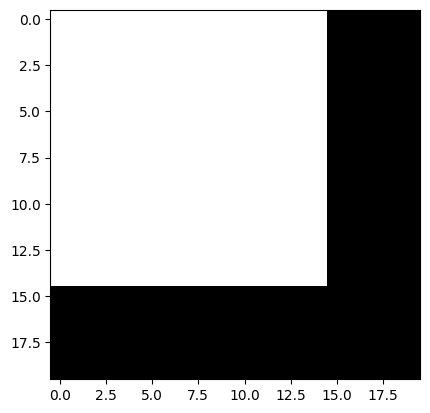

In [5]:
img = np.zeros((3,20,20))
img[:,0:15,0:15]=1
plt.imshow(img.transpose(1,2,0))

In [6]:
from torchvision.transforms import v2

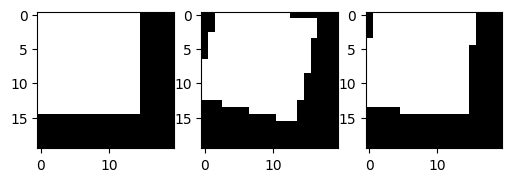

In [7]:
fig, ax = plt.subplots(1,3, figsize=(6,2))
ax[0].imshow(img.transpose(1,2,0))
ax[1].imshow(v2.RandomRotation(45)(torch.tensor(img)).numpy().transpose(1,2,0))
ax[2].imshow(v2.RandomRotation(45)(torch.tensor(img)).numpy().transpose(1,2,0))

RandomCrop(size=(10, 10), padding=[10, 10, 10, 10], pad_if_needed=False, fill=0, padding_mode=constant)
RandomHorizontalFlip(p=0.5)
RandomAffine(degrees=[-25.0, 25.0], translate=(0.3, 0.3), interpolation=InterpolationMode.NEAREST, fill=0)
GaussianBlur(kernel_size=(3, 3), sigma=[0.1, 2.0])
GaussianNoise(mean=0.0, sigma=0.1, clip=True)


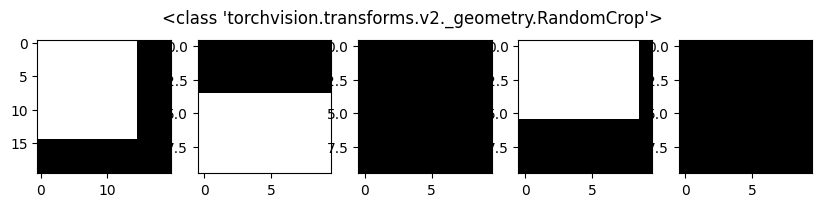

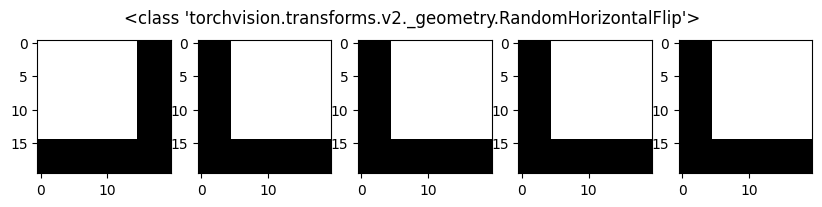

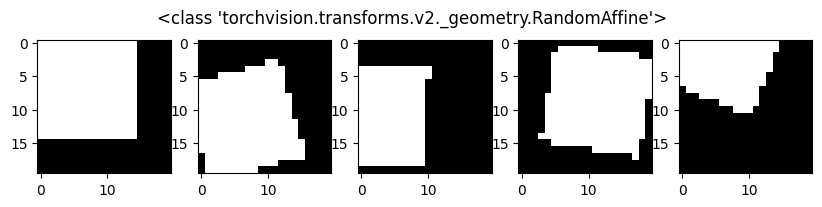

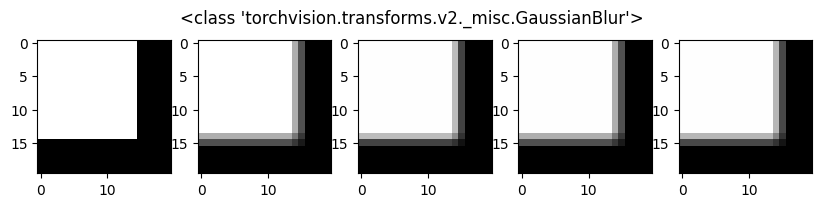

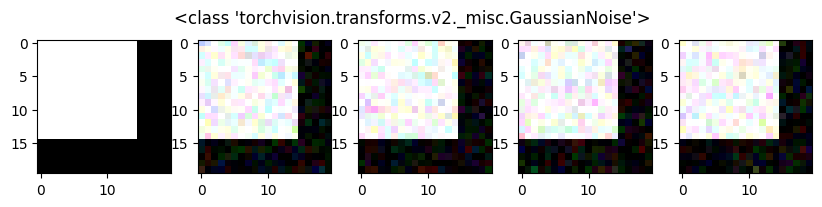

In [8]:
for l in [v2.RandomCrop(10,10),
          v2.RandomHorizontalFlip(),
          #v2.RandomVerticalFlip(),
          v2.RandomAffine(25, translate=(0.3,0.3)),
          v2.GaussianBlur(3),
          v2.GaussianNoise(),]:
  fig, ax = plt.subplots(1,5, figsize=(10,2))
  fig.suptitle(str(l.__class__))
  ax[0].imshow(img.transpose(1,2,0))
  for i in range(4):
    ax[i+1].imshow(l(torch.tensor(img)).numpy().transpose(1,2,0))
  print(l)

In [40]:
import torch.nn as nn
import torch.nn.functional as F

In [77]:
class Net16(nn.Module):
    def __init__(self):
        super().__init__()
        self.c1 = nn.Conv2d(1, 32, kernel_size=3, padding="same")
        self.c2 = nn.Conv2d(32, 32, kernel_size=3, padding="same")

        self.fl = nn.Flatten()
        self.ll1 = nn.Linear(28*28*32, 10)



    def forward(self, x):
        if self.training:
          x = v2.Compose([
              v2.RandomAffine(10, translate=(0.05,0.05)),
              v2.GaussianBlur(kernel_size=3),
              v2.GaussianNoise(),
              v2.ToImage(),
              v2.ToDtype(torch.float32, scale=True),
              ])(x)
        c = self.c1(x)
        c = F.relu(c)
        c = self.c2(c)
        x = x + c
        x = F.relu(x)
        # x = F.max_pool2d(x, kernel_size=3)
        x = self.fl(x)
        # x = F.relu(c)
        x = F.dropout(x, p=0.25)
        x = self.ll1(x)
        return x

net = Net16()
fit(net, epochs=50)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 28, 28]             320
            Conv2d-2           [-1, 32, 28, 28]           9,248
           Flatten-3                [-1, 25088]               0
            Linear-4                   [-1, 10]         250,890
Total params: 260,458
Trainable params: 260,458
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.57
Params size (MB): 0.99
Estimated Total Size (MB): 1.57
----------------------------------------------------------------


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.9709999561309814


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9784999489784241


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.984499990940094


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9791999459266663


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.9846999645233154


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9873999953269958


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9851999878883362


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9864999651908875


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9865999817848206


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9850999712944031


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9882999658584595


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.9893999695777893


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9884999990463257


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9883999824523926


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9901999831199646


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9896999597549438


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9898999929428101


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.989799976348877


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9899999499320984


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9911999702453613


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 20 val accur 0.9910999536514282


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 21 val accur 0.9914000034332275


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 22 val accur 0.9905999898910522


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 23 val accur 0.9914000034332275


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 24 val accur 0.9908999800682068


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 25 val accur 0.9924999475479126


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 26 val accur 0.9914999604225159


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 27 val accur 0.9918999671936035


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 28 val accur 0.9910999536514282


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 29 val accur 0.991599977016449


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 30 val accur 0.9921000003814697


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 31 val accur 0.9919999837875366


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 32 val accur 0.9928999543190002


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 33 val accur 0.9921000003814697


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 34 val accur 0.9928999543190002


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 35 val accur 0.9921999573707581


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 36 val accur 0.9917999505996704


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 37 val accur 0.9921999573707581


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 38 val accur 0.9923999905586243


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 39 val accur 0.9924999475479126


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 40 val accur 0.9927999973297119


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 41 val accur 0.9926999807357788


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 42 val accur 0.991599977016449


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 43 val accur 0.9916999936103821


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 44 val accur 0.9900999665260315


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 45 val accur 0.9921999573707581


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 46 val accur 0.9926999807357788


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 47 val accur 0.9918999671936035


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 48 val accur 0.9919999837875366


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 49 val accur 0.9917999505996704


In [55]:
net.eval()
net.train()
net.training

True

# Final test on EMNIST

In [ ]:
# refit a good network
net = nn.Sequential(
    nn.Conv2d(1, 32, kernel_size=3),
    nn.ReLU(),
    nn.Conv2d(32, 32, kernel_size=3),
    nn.ReLU(),
    nn.MaxPool2d(2),
    nn.Conv2d(32, 32, kernel_size=3),
    nn.ReLU(),
    nn.MaxPool2d(2),
    nn.Flatten(),
    nn.Dropout(0.25),
    nn.Linear(5*5*32, 128),
    nn.ReLU(),
    nn.Dropout(0.25),
    nn.Linear(128, 10),
  )
fit(net, epochs=20)
net.eval()

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 26, 26]             320
              ReLU-2           [-1, 32, 26, 26]               0
            Conv2d-3           [-1, 32, 24, 24]           9,248
              ReLU-4           [-1, 32, 24, 24]               0
         MaxPool2d-5           [-1, 32, 12, 12]               0
            Conv2d-6           [-1, 32, 10, 10]           9,248
              ReLU-7           [-1, 32, 10, 10]               0
         MaxPool2d-8             [-1, 32, 5, 5]               0
           Flatten-9                  [-1, 800]               0
          Dropout-10                  [-1, 800]               0
           Linear-11                  [-1, 128]         102,528
             ReLU-12                  [-1, 128]               0
          Dropout-13                  [-1, 128]               0
           Linear-14                   

  0%|          | 0/469 [00:00<?, ?it/s]

epoch 0 val accur 0.98089998960495


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 1 val accur 0.9858999848365784


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 2 val accur 0.9892999529838562


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 3 val accur 0.9907999634742737


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 4 val accur 0.991599977016449


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 5 val accur 0.9916999936103821


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 6 val accur 0.9922999739646912


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 7 val accur 0.9922999739646912


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 8 val accur 0.9928999543190002


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 9 val accur 0.9932999610900879


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 10 val accur 0.9929999709129333


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 11 val accur 0.9941999912261963


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 12 val accur 0.9928999543190002


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 13 val accur 0.9929999709129333


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 14 val accur 0.9935999512672424


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 15 val accur 0.9928999543190002


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 16 val accur 0.9940999746322632


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 17 val accur 0.9939000010490417


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 18 val accur 0.9932999610900879


  0%|          | 0/469 [00:00<?, ?it/s]

epoch 19 val accur 0.9932000041007996


Sequential(
  (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (1): ReLU()
  (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
  (3): ReLU()
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
  (6): ReLU()
  (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (8): Flatten(start_dim=1, end_dim=-1)
  (9): Dropout(p=0.25, inplace=False)
  (10): Linear(in_features=800, out_features=128, bias=True)
  (11): ReLU()
  (12): Dropout(p=0.25, inplace=False)
  (13): Linear(in_features=128, out_features=10, bias=True)
)

In [56]:
!wget https://biometrics.nist.gov/cs_links/EMNIST/gzip.zip

--2025-03-20 10:28:02--  https://biometrics.nist.gov/cs_links/EMNIST/gzip.zip
Resolving biometrics.nist.gov (biometrics.nist.gov)... 54.85.30.225
Connecting to biometrics.nist.gov (biometrics.nist.gov)|54.85.30.225|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 561753746 (536M) [application/zip]
Saving to: ‘gzip.zip’

gzip.zip            100%[===================>] 535.73M  13.3MB/s    in 43s     

2025-03-20 10:28:46 (12.4 MB/s) - ‘gzip.zip’ saved [561753746/561753746]



In [57]:
from zipfile import ZipFile
import gzip
from pprint import pprint

with ZipFile("gzip.zip", "r") as zip_f:
    pprint(zip_f.infolist())
    with zip_f.open("gzip/emnist-digits-train-images-idx3-ubyte.gz") as f_gz:
        with gzip.open(f_gz) as f:
            meta = f.read(16) # skip metadata
            ex = np.frombuffer(f.read(), dtype=np.uint8)
    with zip_f.open('gzip/emnist-digits-train-labels-idx1-ubyte.gz') as f_gz:
        with gzip.open(f_gz) as f:
            meta = f.read(8) # skip metadata
            y = np.frombuffer(f.read(), dtype=np.uint8)

[<ZipInfo filename='gzip/emnist-balanced-mapping.txt' compress_type=deflate external_attr=0x20 file_size=328 compress_size=169>,
 <ZipInfo filename='gzip/emnist-balanced-test-images-idx3-ubyte.gz' compress_type=deflate external_attr=0x20 file_size=4714707 compress_size=4716147>,
 <ZipInfo filename='gzip/emnist-balanced-test-labels-idx1-ubyte.gz' external_attr=0x20 file_size=13504>,
 <ZipInfo filename='gzip/emnist-balanced-train-images-idx3-ubyte.gz' compress_type=deflate external_attr=0x20 file_size=28207740 compress_size=28216340>,
 <ZipInfo filename='gzip/emnist-balanced-train-labels-idx1-ubyte.gz' compress_type=deflate external_attr=0x20 file_size=80618 compress_size=80643>,
 <ZipInfo filename='gzip/emnist-byclass-mapping.txt' compress_type=deflate external_attr=0x20 file_size=447 compress_size=216>,
 <ZipInfo filename='gzip/emnist-byclass-test-images-idx3-ubyte.gz' compress_type=deflate external_attr=0x20 file_size=28908322 compress_size=28917137>,
 <ZipInfo filename='gzip/emnist-b

In [58]:
ex = ex.reshape(-1,1,28,28).swapaxes(2,3)  # transpose needed!!!
ex = ex.astype(np.float32) / 255
ex.max()

np.float32(1.0)

[8 9 6 3 6 6 7 1 9 0 9 6 8 4 8 3 3 7 0 9 5 1 1 8 1 9 9 1 4 7 0 1 4 4 4 5]


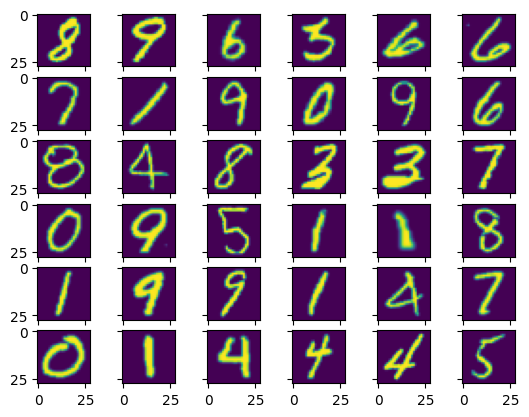

In [59]:
_, ax = plt.subplots(6, 6, sharex=True, sharey=True, squeeze=True)
for i, a in enumerate(ax.ravel()):
    a.imshow(ex[i,0,:,:])
print(y[:len(ax.ravel())])

In [60]:
print(ex.shape)

(240000, 1, 28, 28)


In [61]:
net.to("cuda")
x = torch.tensor(ex)
x = x.to("cuda")
yy = net(x)

OutOfMemoryError: CUDA out of memory. Tried to allocate 22.43 GiB. GPU 0 has a total capacity of 14.74 GiB of which 12.03 GiB is free. Process 11064 has 2.71 GiB memory in use. Of the allocated memory 1.63 GiB is allocated by PyTorch, and 966.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [78]:
i = 0
N = ex.shape[0]
pred = []
net.eval()
with torch.no_grad():
  while i < N:
    x = torch.tensor(ex[i:min(N,i+128)])
    if torch.cuda.is_available():
      # move only small arrays to save GPU mem
      x = x.to("cuda")
    yy = net(x)
    p = yy.argmax(axis=1).cpu().numpy()
    del x # free GPU mem
    del yy # free GPU mem
    pred.extend(p)
    i += 128
print(pred)
print(list(y))
accur = np.mean(pred == y)
print(accur)

[np.int64(8), np.int64(8), np.int64(6), np.int64(3), np.int64(6), np.int64(6), np.int64(7), np.int64(1), np.int64(9), np.int64(0), np.int64(9), np.int64(6), np.int64(8), np.int64(4), np.int64(8), np.int64(3), np.int64(3), np.int64(1), np.int64(0), np.int64(9), np.int64(5), np.int64(1), np.int64(1), np.int64(8), np.int64(1), np.int64(9), np.int64(9), np.int64(1), np.int64(4), np.int64(1), np.int64(0), np.int64(1), np.int64(4), np.int64(4), np.int64(4), np.int64(5), np.int64(9), np.int64(2), np.int64(0), np.int64(2), np.int64(6), np.int64(4), np.int64(1), np.int64(2), np.int64(8), np.int64(8), np.int64(8), np.int64(8), np.int64(0), np.int64(2), np.int64(7), np.int64(1), np.int64(9), np.int64(0), np.int64(1), np.int64(5), np.int64(1), np.int64(0), np.int64(6), np.int64(9), np.int64(8), np.int64(2), np.int64(4), np.int64(8), np.int64(9), np.int64(4), np.int64(8), np.int64(5), np.int64(8), np.int64(5), np.int64(8), np.int64(5), np.int64(4), np.int64(3), np.int64(5), np.int64(2), np.int64(0)

In [63]:
torch.cuda.empty_cache()
#del p

### Pre-trained networks

In [79]:
import torchvision as tv

In [80]:
tv.models.list_models()

['alexnet',
 'convnext_base',
 'convnext_large',
 'convnext_small',
 'convnext_tiny',
 'deeplabv3_mobilenet_v3_large',
 'deeplabv3_resnet101',
 'deeplabv3_resnet50',
 'densenet121',
 'densenet161',
 'densenet169',
 'densenet201',
 'efficientnet_b0',
 'efficientnet_b1',
 'efficientnet_b2',
 'efficientnet_b3',
 'efficientnet_b4',
 'efficientnet_b5',
 'efficientnet_b6',
 'efficientnet_b7',
 'efficientnet_v2_l',
 'efficientnet_v2_m',
 'efficientnet_v2_s',
 'fasterrcnn_mobilenet_v3_large_320_fpn',
 'fasterrcnn_mobilenet_v3_large_fpn',
 'fasterrcnn_resnet50_fpn',
 'fasterrcnn_resnet50_fpn_v2',
 'fcn_resnet101',
 'fcn_resnet50',
 'fcos_resnet50_fpn',
 'googlenet',
 'inception_v3',
 'keypointrcnn_resnet50_fpn',
 'lraspp_mobilenet_v3_large',
 'maskrcnn_resnet50_fpn',
 'maskrcnn_resnet50_fpn_v2',
 'maxvit_t',
 'mc3_18',
 'mnasnet0_5',
 'mnasnet0_75',
 'mnasnet1_0',
 'mnasnet1_3',
 'mobilenet_v2',
 'mobilenet_v3_large',
 'mobilenet_v3_small',
 'mvit_v1_b',
 'mvit_v2_s',
 'quantized_googlenet',
 '

In [81]:
vw = tv.models.get_model_weights('vgg16')
vw

<enum 'VGG16_Weights'>

In [82]:
for w in vw:
  print(w)
# weights differ with input transforms

VGG16_Weights.IMAGENET1K_V1
VGG16_Weights.IMAGENET1K_FEATURES


In [83]:
vw.DEFAULT

VGG16_Weights.IMAGENET1K_V1

In [84]:
vgg16 = tv.models.vgg16(weights="IMAGENET1K_V1")

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:09<00:00, 57.8MB/s]


In [85]:
vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [95]:
vgg16.to("cuda")

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [86]:
preproc = vw.DEFAULT.transforms()

In [87]:
img_url = "https://upload.wikimedia.org/wikipedia/commons/3/37/African_Bush_Elephant.jpg"
img_path = 'test.jpg'

In [88]:
import matplotlib.pyplot as plt
import numpy as np
import urllib

In [89]:
from torchvision.io import decode_image

torch.Size([3, 3888, 2592])
torch.uint8


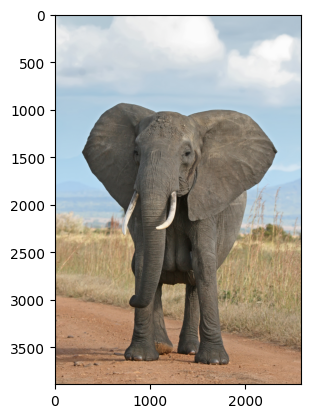

In [90]:
urllib.request.urlretrieve(img_url, img_path)
img = decode_image(img_path)
print(img.shape)
print(img.dtype)
plt.imshow(img.permute((1,2,0))/255)

In [91]:
x = preproc(img)

torch.Size([3, 224, 224])
torch.float32


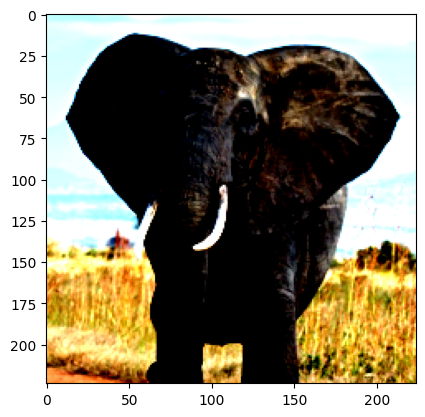

In [92]:
print(x.shape)
print(x.dtype)
plt.imshow(x.permute((1,2,0)))

In [93]:
vgg16.training
vgg16.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [96]:
preds = vgg16(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
print(preds)

[[1.49663282e-09 2.20551116e-12 5.97480398e-11 3.72144919e-11
  3.04995577e-11 8.33734415e-10 1.09924708e-10 7.06713577e-11
  3.91368916e-11 6.43844866e-10 2.93893490e-13 6.71316301e-13
  1.49379597e-12 9.13534439e-13 3.30949439e-12 1.01694076e-12
  2.58374702e-12 1.73334663e-11 5.75711137e-12 4.44785962e-12
  2.12291452e-11 4.63080463e-09 2.18872559e-10 1.72273884e-09
  6.03206041e-10 7.10578861e-12 4.21803001e-12 3.17451295e-12
  1.11997625e-11 3.00713360e-12 1.76986420e-12 1.94687300e-12
  4.02849574e-13 1.15454167e-10 1.49310575e-09 7.63903885e-10
  1.70048076e-09 4.77293538e-10 3.86466414e-11 8.50227000e-10
  1.60220639e-11 5.64337899e-12 1.47233545e-11 8.11349543e-10
  5.05279325e-11 4.67211617e-11 4.19996121e-11 4.78057038e-10
  8.34070413e-09 3.25594607e-10 1.75818504e-09 6.78440256e-06
  1.61371125e-10 5.76894157e-11 6.22416729e-10 1.61305580e-10
  2.64582605e-12 1.71520166e-12 6.32752795e-10 1.93875107e-11
  1.86379974e-11 1.12898206e-11 3.63308078e-10 5.18409593e-10
  5.1779

In [97]:
preds.max()

np.float32(0.60118496)

In [98]:
# Download ImageNet labels
!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
with open("imagenet_classes.txt") as f:
    imagenet_classes = [l.strip() for l in f]
print(imagenet_classes)

--2025-03-20 11:23:26--  https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10472 (10K) [text/plain]
Saving to: ‘imagenet_classes.txt’

imagenet_classes.tx 100%[===================>]  10.23K  --.-KB/s    in 0s      

2025-03-20 11:23:27 (113 MB/s) - ‘imagenet_classes.txt’ saved [10472/10472]

['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'European fire salamander', 'common newt', 'eft', 'spotted salamander', 'axolotl', 'bullfrog',

In [100]:
def decode_predictions(preds, top=5):
    top_preds = np.argsort(preds[0])[-top:]
    for i in reversed(top_preds):
        print(f"{imagenet_classes[i]}: {preds[0, i]:.2}")

In [101]:
decode_predictions(preds)

African elephant: 0.6
tusker: 0.39
Indian elephant: 0.0057
triceratops: 6.8e-06
trilobite: 2.9e-07


In [ ]:
# one more elephant

torch.Size([3, 330, 570])
torch.uint8


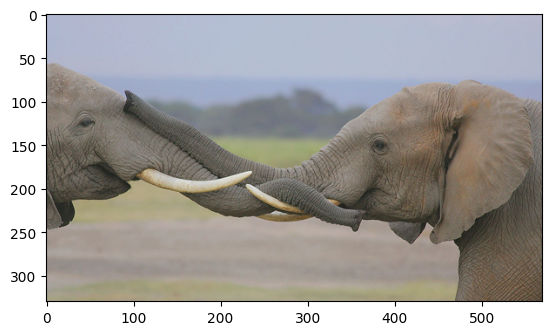

In [102]:
img_url="https://www.biologicaldiversity.org/assets/img/species/mammals/SavannahElephants_Flickr_SteveGarvie.jpg"
urllib.request.urlretrieve(img_url, img_path)
img = decode_image(img_path)
print(img.shape)
print(img.dtype)
plt.imshow(img.permute((1,2,0))/255)

In [103]:
x = preproc(img)
preds = vgg16(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

African elephant: 0.62
tusker: 0.34
Indian elephant: 0.044
triceratops: 1.1e-05
water buffalo: 3.7e-07


In [ ]:
# now a car

torch.Size([3, 1060, 2008])
torch.uint8


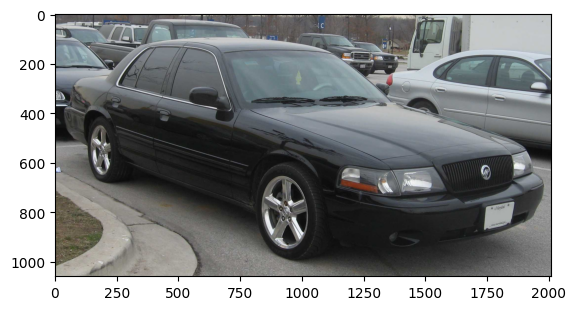

In [104]:
img_url = "https://upload.wikimedia.org/wikipedia/commons/9/9c/Mercury_Marauder.jpg"
urllib.request.urlretrieve(img_url, img_path)
img = decode_image(img_path)
print(img.shape)
print(img.dtype)
plt.imshow(img.permute((1,2,0))/255)

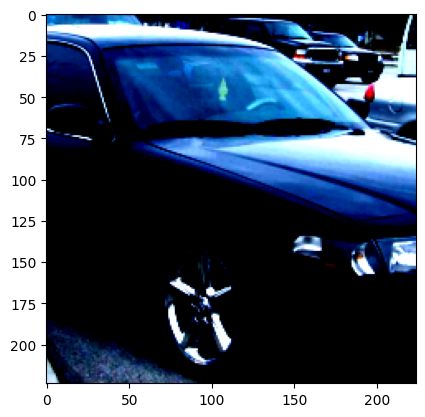

In [105]:
x = preproc(img)
plt.imshow(x.permute((1,2,0)))

In [106]:
preds = vgg16(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

convertible: 0.31
beach wagon: 0.24
car wheel: 0.14
minivan: 0.079
limousine: 0.073


In [107]:
"passenger car" in imagenet_classes

True

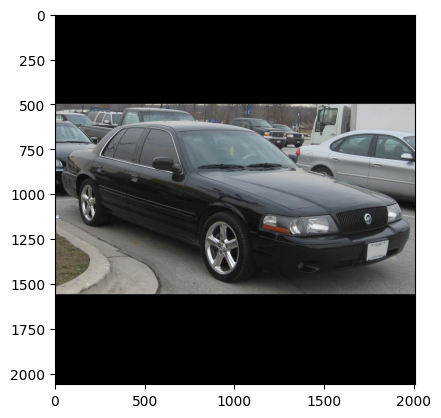

In [108]:
# maybe aspect ratio changed
img_pad = tv.transforms.Pad((0, 500))(img)
plt.imshow(img_pad.permute((1,2,0)))

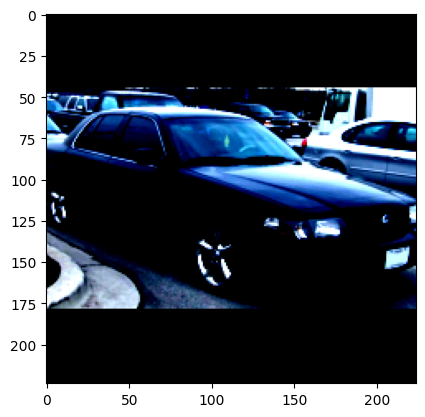

In [109]:
x = preproc(img_pad)
plt.imshow(x.permute((1,2,0)))

In [110]:
preds = vgg16(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

beach wagon: 0.37
limousine: 0.16
car wheel: 0.13
grille: 0.093
convertible: 0.067


# ResNet50 model

In [111]:
vw = tv.models.get_model_weights('ResNet50')
for w in vw:
  print(w)
print(vw.DEFAULT)

ResNet50_Weights.IMAGENET1K_V1
ResNet50_Weights.IMAGENET1K_V2
ResNet50_Weights.IMAGENET1K_V2


In [113]:
resnet50 = tv.models.get_model("resnet50", weights="DEFAULT")

In [114]:
preproc = vw.DEFAULT.transforms()

In [115]:
resnet50.to("cuda")

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [116]:
# resnet 50 source code
# https://github.com/pytorch/vision/blob/main/torchvision/models/resnet.py

In [117]:
resnet50.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

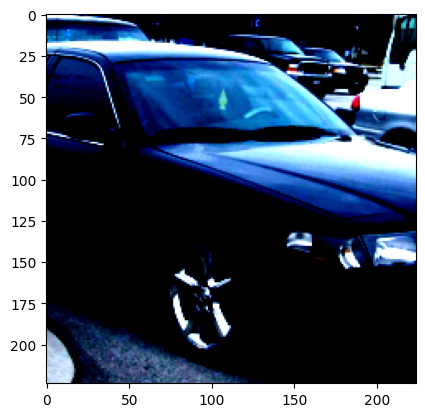

In [118]:
x = preproc(img)
plt.imshow(x.permute((1,2,0)))

In [119]:
preds = resnet50(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

beach wagon: 0.18
limousine: 0.08
minivan: 0.066
car wheel: 0.058
grille: 0.046


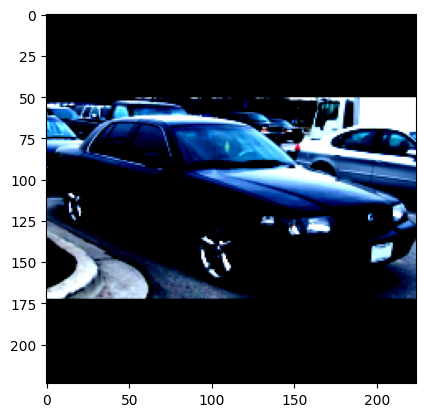

In [120]:
x = preproc(img_pad)
plt.imshow(x.permute((1,2,0)))

In [121]:
preds = resnet50(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

beach wagon: 0.29
limousine: 0.15
car wheel: 0.064
grille: 0.035
minivan: 0.025


torch.Size([3, 1600, 1200])
torch.uint8


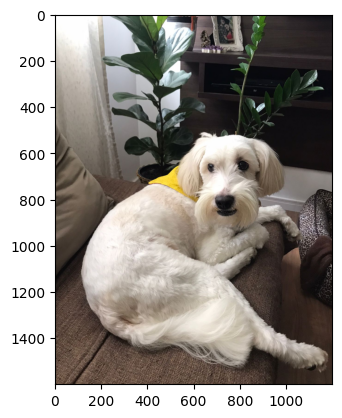

In [128]:
img_url = "https://images.dog.ceo/breeds/cockapoo/Guri1.jpg"
urllib.request.urlretrieve(img_url, img_path)
img = decode_image(img_path)
print(img.shape)
print(img.dtype)
plt.imshow(img.permute((1,2,0))/255)

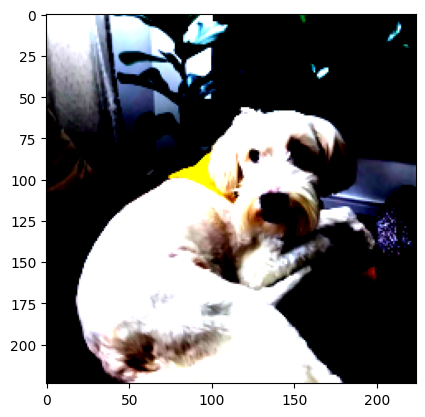

In [129]:
x = preproc(img)
plt.imshow(x.permute((1,2,0)))

In [130]:
preds = vgg16(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

Maltese dog: 0.97
Sealyham terrier: 0.02
Lhasa: 0.0072
West Highland white terrier: 0.0036
Tibetan terrier: 0.0026


torch.Size([3, 968, 968])
torch.uint8


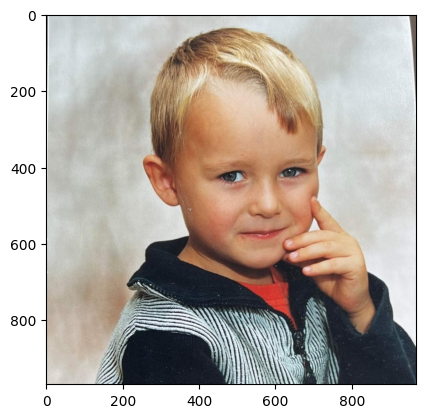

In [132]:
img_url = "https://scontent-waw2-1.xx.fbcdn.net/v/t39.30808-6/345591109_619695460078788_9077639524409927739_n.jpg?_nc_cat=104&ccb=1-7&_nc_sid=6ee11a&_nc_ohc=ueS0SP6nYoMQ7kNvgGehOM2&_nc_oc=AdlRuVJ_gc5adbwjIyp8b19qJftobMCIOOocPkrDTjldlVQvhUFwNkVbNnGSSXzl8Vc&_nc_zt=23&_nc_ht=scontent-waw2-1.xx&_nc_gid=_oATuGGmUey1dJLqBmJHKw&oh=00_AYGUyifTEMQcGAn4G7kqvv9V9PMcdsJLaKeXlK_bh-6Bmg&oe=67E1EB74"
urllib.request.urlretrieve(img_url, img_path)
img = decode_image(img_path)
print(img.shape)
print(img.dtype)
plt.imshow(img.permute((1,2,0))/255)

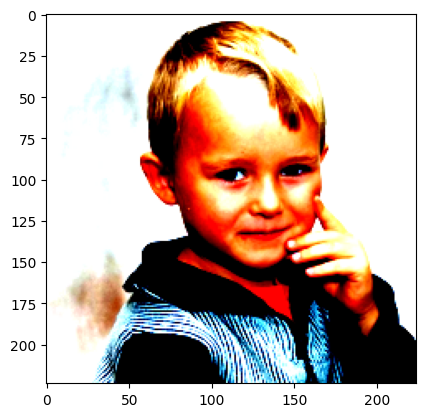

In [133]:
x = preproc(img)
plt.imshow(x.permute((1,2,0)))

In [134]:
preds = vgg16(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

bow tie: 0.22
suit: 0.19
cardigan: 0.057
Windsor tie: 0.05
wool: 0.049


torch.Size([3, 2282, 1920])
torch.uint8


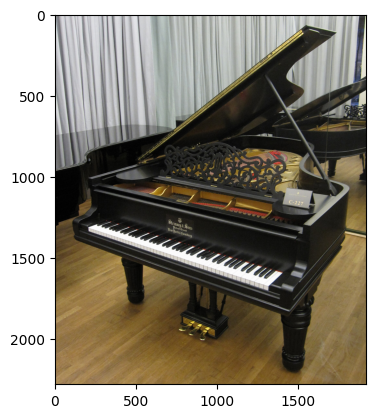

In [142]:
img_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/0/01/Steinway_Vienna_002.JPG/1920px-Steinway_Vienna_002.JPG"
urllib.request.urlretrieve(img_url, img_path)
img = decode_image(img_path)
print(img.shape)
print(img.dtype)
plt.imshow(img.permute((1,2,0))/255)


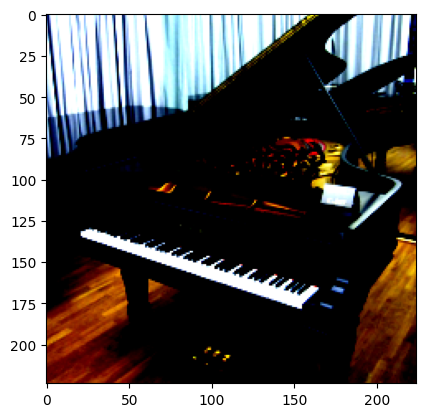

In [143]:
x = preproc(img)
plt.imshow(x.permute((1,2,0)))

In [144]:
preds = vgg16(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

grand piano: 1.0
upright: 9.1e-05
organ: 2.8e-08
harp: 2.7e-09
pool table: 1.3e-09


torch.Size([3, 1350, 1080])
torch.uint8


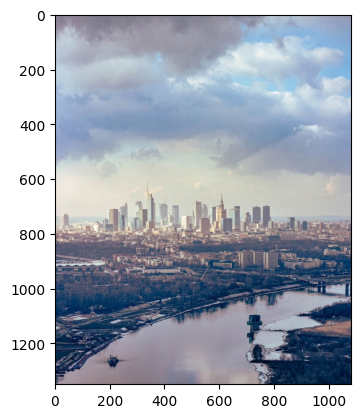

In [145]:
img_url = "https://scontent-waw2-2.xx.fbcdn.net/v/t39.30808-6/485293844_1091326983034940_5309372344709075939_n.jpg?_nc_cat=107&ccb=1-7&_nc_sid=833d8c&_nc_ohc=XGZkCnqITVQQ7kNvgHCDHau&_nc_oc=AdkMnSES9WGVdT4kL6Q3K4nkqW_v1trSg8s6Dcub-BsJhNHezCgr_MuYXrCw-vLkm5M&_nc_zt=23&_nc_ht=scontent-waw2-2.xx&_nc_gid=mMXxicBjXD9RTtuYDRDf_g&oh=00_AYGcGzxPxTa4fhy8VPJYdxmqna2DQEp91lW9cRNWmRPXqA&oe=67E1C894"
urllib.request.urlretrieve(img_url, img_path)
img = decode_image(img_path)
print(img.shape)
print(img.dtype)
plt.imshow(img.permute((1,2,0))/255)

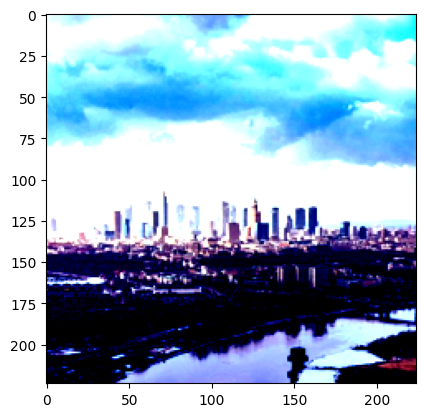

In [146]:
x = preproc(img)
plt.imshow(x.permute((1,2,0)))

In [147]:
preds = vgg16(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

seashore: 0.36
breakwater: 0.13
lakeside: 0.077
promontory: 0.076
aircraft carrier: 0.051


In [148]:
preds = resnet50(x.unsqueeze(0).to("cuda"))
preds = F.softmax(preds, dim=1)
preds = preds.cpu().detach().numpy()
decode_predictions(preds)

lakeside: 0.072
seashore: 0.067
airship: 0.036
breakwater: 0.028
wing: 0.026
